### Sulaiman Yusuf Zakaria - Predicting Airbnb Listing Prices in Melbourne, Australia

--- 

**Kaggle Competition Ends:** Friday, 6 June 2025 @ 3:00pm (Week 13)  
**Assignment Due Date on iLearn:** Friday, 6 June 2025 @ 11.55pm (Week 13)   
**Total Marks:** 30

**Overview:**   

- In the group assignment you will form a team of 3 students and participate in a forecasting competition on Kaggle


**Instructions:** 

- Form a team of 3 students 
- Each team member needs to join [https://www.kaggle.com](https://www.kaggle.com/)  
- Choose a team leader and form a team on Kaggle [https://www.kaggle.com/t/fc5974a56165cea945ee1ec182b079af](https://www.kaggle.com/t/fc5974a56165cea945ee1ec182b079af)
    - Team leader to click on `team` and invite other 2 team members to join
    - Your **team's name must start** with our unit code
- All team members should work on all the tasks however   
    - Each team member will be responsible for one of the 3 tasks listed below    
- **Your predictions must be generated by a model you develop here** 
    - You will receive a mark of **zero** if your code is not able produce the forecasts you submit to Kaggle 

**Competition Rankings**

The rankings for the competition are determined through two different leaderboards:

- **Public Leaderboard Ranking**: Available during the competition, these rankings are calculated based on 50% of the test dataset, which includes 1,500 observations. This allows participants to see how they are performing while the competition is still ongoing.
- **Final Leaderboard Ranking**: These rankings are recalculated from the other 50% of the test dataset, which consists of the remaining 1,500 observations, and are revealed 5 minutes after the competition concludes. This final evaluation determines the ultimate standings of the competition.



**Marks** 

- Assignment: 30 marks consisting of Solutions (27 marks) + Video Presentation (3 marks)
- **Each Student's Mark: 50% x overall assignment mark + 50% x mark for the task that you are responsible for**  



**Submissions:**  

1. On Kaggle: submit your team's forecast in order to be ranked by Kaggle
2. On iLearn **only team leader to submit** the assignment Jupyter notebook re-named to your team's name on Kaggle   
    - The Jupyter notebook must contain team members names/ID numbers, and the group name Kaggle
    - One 15 minute video recording of your work 
        - 5 marks will be deducted from each Task for which there is no video presentation   


### Assignment Context

The following project was completed as part of the BUSA8001 Group Assignment – Predicting Airbnb Listing Prices in Melbourne, Australia. The original task involved forming a team of three students to submit a forecasting solution on Kaggle.

> My role: I was responsible for **Task 2 – Data Cleaning and Feature Engineering** in our group submission under the name **BUSA8001_BroccoliSpace**, which achieved a private leaderboard RMSE of 111.981 (9th place).

After the competition concluded, I independently rebuilt and optimised the entire pipeline. My individual submission achieved an improved RMSE of **111.105**, and is presented below as part of my personal portfolio.


---

## Task 1: Problem Description and Initial Data Analysis

- You must clearly explain all your answers in both the Markdown file and the recorded video.

Based on the Competition Overview, datasets and additional information provided on Kaggle, along with insights gained from personal research of the topic, write **Problem Description** (about 500 words) focusing on the sections listed below: 
1. Forecasting Problem - explain what we are trying to do and how it could be used in the real world, e.g. who and how may benefit from it (2 marks)    
2. Evaluation Criteria - discuss the criterion that is used in this competition to assess forecasting performance, and its pros and cons. (2 marks)     
3. Categorise all variables provided in the dataset according to their type; Hint: similar to what we had in Programming Task 1 (2 marks)  
4. Missing Values - explain what you find for both the training and test datasets at this stage (2 marks)
5. Provide and discuss some interesting *univariate* data characteristics (e.g. summary statistics and plots) in the training dataset  (1 marks)       
- Hints:
    - You should **not** discuss any specific predictive algorithms at this stage


## 1. Problem Description and Initial Data Analysis

### Import and Load

In [10]:
# 📦 Core Libraries
import os
import re
import ast
import numpy as np
import pandas as pd
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

# 📊 Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from IPython.display import Image, display

# 📍 Geospatial
from geopy.distance import geodesic
from sklearn.neighbors import BallTree

# 🔡 Text Processing
from nltk.corpus import words
from nltk import download
download('words')  # Run once

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

# ⚙️ Preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# 🔁 Clustering
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import silhouette_score

# 🔢 Modelling
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# 📈 Evaluation & CV
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, make_scorer


[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Sulaiman\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


In [11]:
# Load Data
train = pd.read_csv('Data/train.csv')
test = pd.read_csv('Data/test.csv')
transport_df = pd.read_csv('Data/metro_melbourne_transport_stops_sample.csv')

# Only needs to be run once after initial file read
train_original = train.copy()
test_original = test.copy()

### 1.1 Forcasting Problem

The primary objective of this project is to build a predictive model that estimates the nightly price of Airbnb listings in Melbourne based on various structured features. These features include property characteristics (e.g., number of bedrooms, bathrooms, property type), host attributes (e.g., response time, number of listings), review scores, and location details.

This is a **supervised learning** task framed as a **regression problem**, where the target variable is `price` is a continuous numerical value representing the listing's nightly cost. The training dataset provides thousands of historical listings with known prices, while the test dataset includes new listings where prices need to be predicted.

Understanding and accurately forecasting Airbnb prices has practical value:
- **For hosts**, it supports dynamic pricing strategies and helps them set competitive, market-aligned prices.
- **For guests**, it improves transparency and assists in identifying listings that offer better value for money.
- **For platforms**, it can be used to enhance recommendation systems and support overall marketplace efficiency.

The dataset used in this project was collected via web scraping from Airbnb listings in Melbourne. It contains a mix of numerical, categorical, textual, and date-based features. To ensure fair model comparison, no new features are added beyond those constructed in the prior preprocessing task.

The final predictions will be submitted to a Kaggle-hosted competition environment, where model performance will be evaluated using a hold-out test set based on Root Mean Squared Error (RMSE).

### 1.2 Evaluation Criteria

The primary evaluation metric used for this competition is **Root Mean Squared Error (RMSE)**, which measures the average magnitude of the errors between predicted and actual prices. RMSE is defined as the square root of the average of the squared differences between predictions and true values.

The formula for RMSE is:

$$
\text{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}
$$

Where:  
- y_i is the actual price
- ŷ_i is the predicted price
- n is the number of observations

RMSE is suitable for this problem because it penalises larger errors more heavily than smaller ones, which is important when predicting prices where large deviations can significantly impact user experience or revenue.

In this competition:
- The **lower the RMSE**, the better the model’s performance.
- Kaggle uses a **hold-out test set** to evaluate predictions and rank teams based on their RMSE on unseen data.

By focusing on RMSE, we aim to develop a model that not only fits the training data but also generalises well to new, real-world listings.

### 1.3 Variable Classification

While initial categorisation can be partially automated using code (e.g. by inspecting data types and unique values), certain variables require human judgment to interpret their contextual meaning. For example, some variables stored as text actually contain numerical or binary information, and some identifiers or descriptive text fields may not be useful for modelling. Therefore, this categorisation is manually reviewed to ensure relevance and accuracy.

All 61 variables from the training dataset are categorised into one of six groups: Boolean, Categorical, Datetime, Numerical, Textual, and Excluded. This classification is based on data types, contextual understanding, and expected relevance to modelling.

| Category       | Count | Variable List | Notes / Adjustments |
|----------------|--------|----------------|----------------------|
| **Boolean**    | 5      | host_is_superhost, host_has_profile_pic, host_identity_verified, has_availability, instant_bookable | Binary fields (stored as 't'/'f') |
| **Categorical**| 4      | source, host_response_time, host_verifications, room_type | Nominal categories |
| **Datetime**   | 3      | host_since, first_review, last_review | Valid date fields, currently stored as string |
| **Numerical**  | 36     | host_listings_count, latitude, longitude, accommodates, bedrooms, beds, minimum_nights, maximum_nights, minimum_minimum_nights, maximum_minimum_nights, minimum_maximum_nights, maximum_maximum_nights, minimum_nights_avg_ntm, maximum_nights_avg_ntm, availability_30, availability_60, availability_90, availability_365, number_of_reviews, number_of_reviews_ltm, number_of_reviews_l30d, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, review_scores_value, calculated_host_listings_count, calculated_host_listings_count_entire_homes, calculated_host_listings_count_private_rooms, calculated_host_listings_count_shared_rooms, reviews_per_month, bathrooms, host_response_rate, host_acceptance_rate | Some variables stored as strings will be cleaned in Task 2 |
| **Textual**    | 9      | description, neighborhood_overview, neighbourhood, neighbourhood_cleansed, property_type, amenities, host_about, host_location, host_neighbourhood | Long free-text fields or descriptive metadata |
| **Excluded**   | 3      | ID, name, host_name | Unique identifiers or low-signal metadata unlikely to improve model |
| **Target**     | 1      | price | Variable to be predicted |

**Note**: Several variables, although stored as text, clearly contain numeric information and will be cleaned during Task 2. Variables under the 'Excluded' category are unlikely to add value and will not be used in model training.

### 1.4 Missing Values

In [19]:
# Calculate percentage of missing values for train and test
missing_train_pct = (train.isnull().sum() / len(train) * 100).round(2)
missing_test_pct = (test.isnull().sum() / len(test) * 100).round(2)

# Combine into summary table
missing_summary = pd.DataFrame({
    'Missing in Train': train.isnull().sum(),
    '% in Train': missing_train_pct,
    'Missing in Test': test.isnull().sum(),
    '% in Test': missing_test_pct
})

# Filter rows where there is at least one missing value
missing_summary = missing_summary[(missing_summary['Missing in Train'] > 0) | (missing_summary['Missing in Test'] > 0)]
missing_summary = missing_summary.sort_values(by='Missing in Train', ascending=False)

missing_summary.reset_index().rename(columns={'index': 'Column'})


,Column,Missing in Train,% in Train,Missing in Test,% in Test
0,host_neighbourhood,3460,49.43,2066.0,68.87
1,host_about,2270,32.43,1441.0,48.03
2,neighborhood_overview,1823,26.04,1424.0,47.47
3,neighbourhood,1823,26.04,1424.0,47.47
4,host_location,1280,18.29,770.0,25.67
5,bedrooms,378,5.40,60.0,2.00
6,room_type,134,1.91,41.0,1.37
7,neighbourhood_cleansed,108,1.54,42.0,1.40
8,property_type,84,1.20,39.0,1.30
9,beds,72,1.03,12.0,0.40


In [20]:
# Use original missing_summary table and add classification logic
missing_summary = missing_summary.reset_index().rename(columns={'index': 'Column'})

# Apply classification rules
def classify(row):
    if row['% in Train'] > 30 or row['% in Test'] > 30:
        return 'Drop'
    elif row['% in Train'] <= 10 and row['% in Test'] <= 10:
        return 'Impute'
    else:
        return 'Review'

missing_summary['Action'] = missing_summary.apply(classify, axis=1)

# Group by action
grouped = missing_summary.groupby('Action').agg({
    'Column': list,
    'Column': 'count'
}).rename(columns={'Column': 'Feature List', 'Column': 'Count'})

# Fix correct aggregation manually
summary_df = pd.DataFrame({
    'Action': ['Drop', 'Review', 'Impute'],
    'Count': [
        missing_summary[missing_summary['Action'] == 'Drop'].shape[0],
        missing_summary[missing_summary['Action'] == 'Review'].shape[0],
        missing_summary[missing_summary['Action'] == 'Impute'].shape[0],
    ],
    'Feature List': [
        missing_summary[missing_summary['Action'] == 'Drop']['Column'].tolist(),
        missing_summary[missing_summary['Action'] == 'Review']['Column'].tolist(),
        missing_summary[missing_summary['Action'] == 'Impute']['Column'].tolist(),
    ]
})

summary_df


,Action,Count,Feature List
0,Drop,4,"[host_neighbourhood, host_about, neighborhood_..."
1,Review,4,"[host_location, host_acceptance_rate, host_res..."
2,Impute,22,"[bedrooms, room_type, neighbourhood_cleansed, ..."


#### Explanation

To ensure consistent and reliable model training, all features containing missing values were systematically reviewed and classified into three handling strategies: **Drop**, **Review**, and **Impute**. This classification was based on the percentage of missing data in both the training and test sets, combined with contextual judgment regarding the nature and usefulness of each feature.

- **Drop**: Features with a high proportion of missing values (typically over 30% in either dataset) were assigned to the Drop category. These features were excluded from modelling because imputing them would introduce too much uncertainty, and their contribution to predictive performance was likely minimal (e.g., unstructured text or optional metadata fields).

- **Review**: This category includes features with a moderate level of missingness or those that are potentially valuable for modelling but present inconsistencies between training and test data. These features will be examined more closely in later steps to decide whether to include them, and if so, how to handle their missing values appropriately.

- **Impute**: Features with low levels of missing data (typically less than 10% in both datasets) were retained and scheduled for imputation. These features are considered reliable, and the missing values will be filled using appropriate methods such as mean, median, or mode imputation, depending on the feature type.

This structured approach allows for more informed preprocessing decisions while maintaining consistency and reducing the risk of data leakage or bias due to improper handling of missing values.

### 1.5 Univariate Analysis

This step focuses on analysing each feature individually to understand its distribution, scale, and overall structure. It helps us:

- Identify outliers or anomalies
- Understand skewness, spread, and potential transformations
- Detect incorrect or inconsistent data types
- Guide feature engineering in the next steps

#### Cek Unique

In [26]:
# Ensure all columns and rows are fully displayed
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

# Then show the full unique count summary
unique_counts = pd.DataFrame({
    'Data Type': train.dtypes,
    'Unique Values': train.nunique()
}).sort_values(by='Unique Values', ascending=False)

print(unique_counts)

                                             Data Type  Unique Values
ID                                               int64           7000
name                                            object           6869
amenities                                       object           6763
description                                     object           6703
longitude                                      float64           5687
latitude                                       float64           5599
neighborhood_overview                           object           4375
first_review                                    object           2595
host_about                                      object           2527
host_since                                      object           2278
host_name                                       object           2066
last_review                                     object            925
price                                           object            703
reviews_per_month   

#### 1.5.1 Boolean Variable

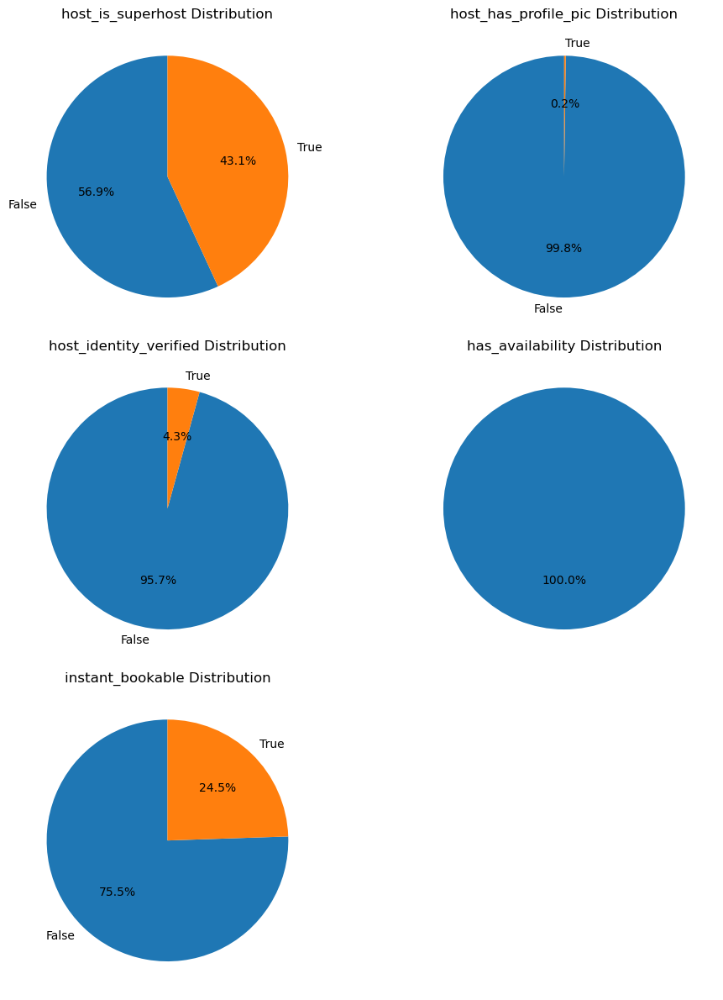

In [28]:
# Define list of boolean variables
boolean_vars = [
    'host_is_superhost', 'host_has_profile_pic',
    'host_identity_verified', 'has_availability',
    'instant_bookable'
]

n = len(boolean_vars)
fig, axes = plt.subplots(nrows=(n + 1) // 2, ncols=2, figsize=(10, 4 * ((n + 1) // 2)))
axes = axes.flatten()

for i, col in enumerate(boolean_vars):
    train[col].value_counts(dropna=False).plot.pie(
        ax=axes[i],
        autopct='%1.1f%%',
        startangle=90,
        labels=['False', 'True'] if set(train[col].dropna().unique()) == {'f', 't'} else None,
        textprops={'fontsize': 10}
    )
    axes[i].set_title(f'{col} Distribution')
    axes[i].set_ylabel('')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#### 1.5.2 Categorical Variables

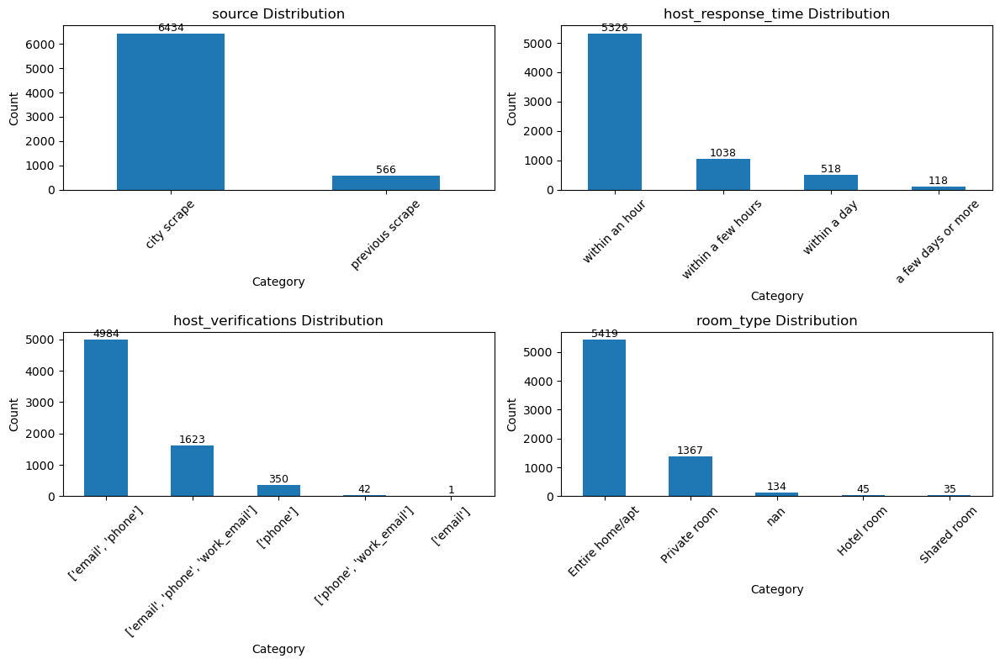

In [30]:
# Define the list of categorical variables
categorical_vars = [
    'source', 'host_response_time', 'host_verifications', 'room_type',
]

# Create subplots: 2 columns layout
n = len(categorical_vars)
fig, axes = plt.subplots(nrows=(n + 1) // 2, ncols=2, figsize=(12, 4 * ((n + 1) // 2)))
axes = axes.flatten()

for i, col in enumerate(categorical_vars):
    ax = axes[i]
    value_counts = train[col].value_counts(dropna=False)

    bars = value_counts.plot(
        kind='bar',
        ax=ax,
        color=sns.color_palette()[0]
    )
    ax.set_title(f'{col} Distribution')
    ax.set_xlabel('Category')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45)

    # Add count labels above each bar
    for p in bars.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height(), int(p.get_height()),
                ha='center', va='bottom', fontsize=9)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#### 1.5.3 DateTime Variables

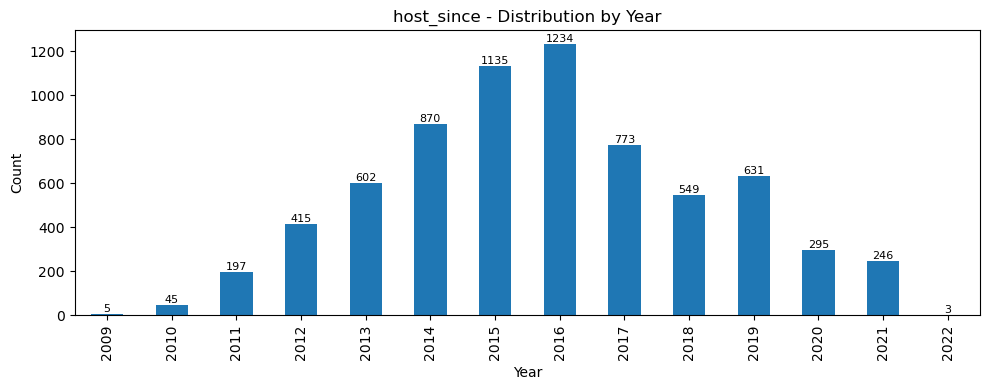

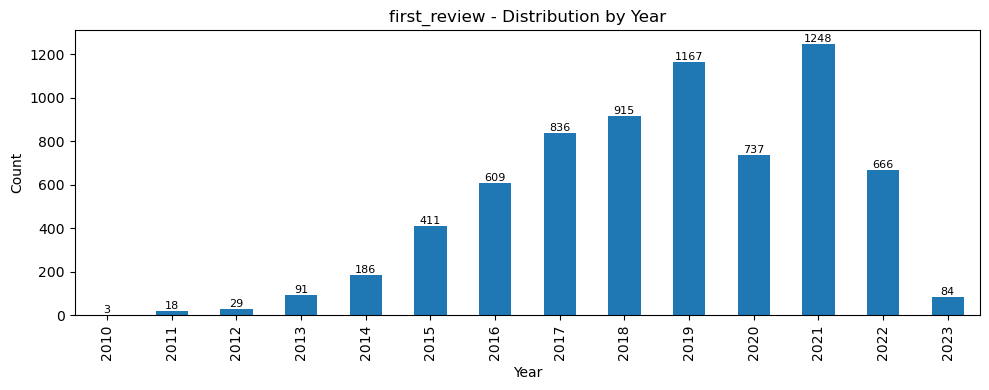

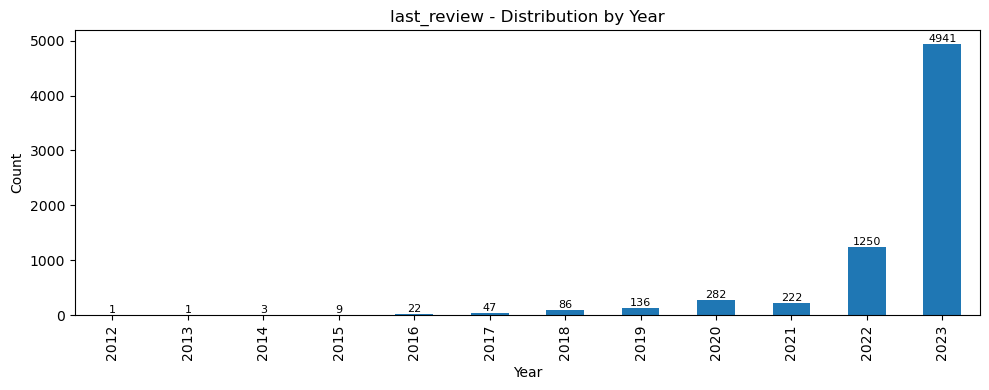

In [32]:
# Convert to datetime
train['host_since'] = pd.to_datetime(train['host_since'], errors='coerce')
train['first_review'] = pd.to_datetime(train['first_review'], errors='coerce')
train['last_review'] = pd.to_datetime(train['last_review'], errors='coerce')

# Plot each distribution one by one
for col in ['host_since', 'first_review', 'last_review']:
    plt.figure(figsize=(10, 4))
    year_counts = train[col].dt.year.value_counts().sort_index()
    bars = year_counts.plot(kind='bar')
    
    plt.title(f'{col} - Distribution by Year')
    plt.xlabel('Year')
    plt.ylabel('Count')
    for p in bars.patches:
        plt.text(p.get_x() + p.get_width() / 2, p.get_height(), int(p.get_height()),
                 ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


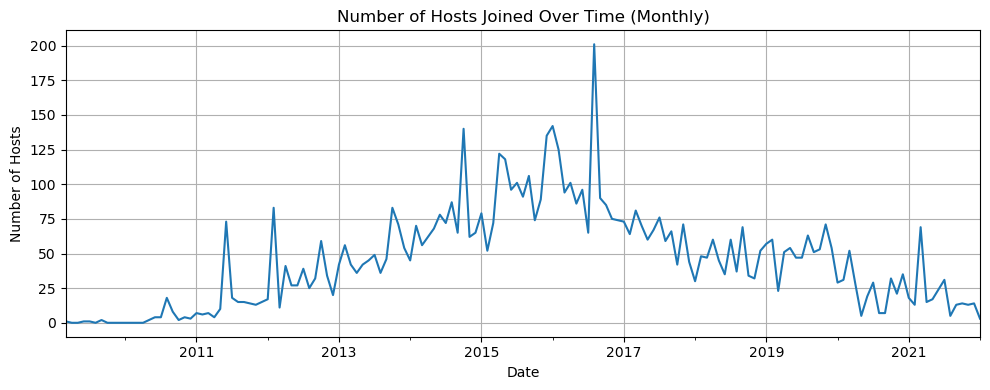

In [33]:
# Ensure datetime format and set as index
train['host_since'] = pd.to_datetime(train['host_since'], errors='coerce')
host_counts = train['host_since'].value_counts().sort_index()
host_counts = host_counts.resample('M').sum()  # Resample to monthly counts

# Plot
plt.figure(figsize=(10, 4))
host_counts.plot()
plt.title("Number of Hosts Joined Over Time (Monthly)")
plt.xlabel("Date")
plt.ylabel("Number of Hosts")
plt.grid(True)
plt.tight_layout()
plt.show()


#### 1.5.4 Textual Variables

In [35]:
# Define textual columns
textual_cols = [
    'description', 'neighborhood_overview', 'neighbourhood',
    'neighbourhood_cleansed', 'property_type', 'amenities',
    'host_about', 'host_location', 'host_neighbourhood'
]

# Create summary table
textual_summary = pd.DataFrame(columns=['Missing Count', 'Missing %', 'Avg Text Length'])

for col in textual_cols:
    missing_count = train[col].isna().sum()
    missing_pct = 100 * missing_count / len(train)
    avg_len = train[col].dropna().apply(lambda x: len(str(x))).mean()
    
    textual_summary.loc[col] = [missing_count, round(missing_pct, 2), round(avg_len, 2)]

# Display
textual_summary.sort_values(by='Missing %', ascending=False)


,Missing Count,Missing %,Avg Text Length
host_neighbourhood,3460.0,49.43,13.14
host_about,2270.0,32.43,506.95
neighborhood_overview,1823.0,26.04,409.97
neighbourhood,1823.0,26.04,30.87
host_location,1280.0,18.29,19.75
neighbourhood_cleansed,108.0,1.54,9.24
property_type,84.0,1.20,17.53
description,57.0,0.81,869.07
amenities,0.0,0.00,631.35


Textual variables in this dataset include long-form descriptions, neighbourhood metadata, and host-related content. These variables are stored as strings and cannot be directly used in predictive modelling without preprocessing.

Some fields, such as `description` and `amenities`, contain rich textual information with high average character lengths and no missing values. These may be useful for natural language processing (NLP) or feature extraction techniques in later stages.

Variables like `host_about` and `neighborhood_overview` also have substantial content but with moderate levels of missingness. Their inclusion will depend on whether missing values can be meaningfully handled.

Other fields, including `host_neighbourhood`, `neighbourhood`, and `host_location`, have either high missing percentages or very short average text lengths, limiting their immediate modelling potential unless transformed into structured categories.

At this stage, textual variables are not visualised due to their unstructured format, but they are marked for possible future use through keyword analysis or vector embeddings.

#### 1.5.5 Mapping Listing Locations

In [38]:
# Create a base map centered around the average coordinates
center_lat = train['latitude'].mean()
center_lon = train['longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=11)

# Add train listings in blue
train_cluster = MarkerCluster(name='Train Listings').add_to(m)
for _, row in train.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=2,
        color='blue',
        fill=True,
        fill_opacity=0.4
    ).add_to(train_cluster)

# Add test listings in red
test_cluster = MarkerCluster(name='Test Listings').add_to(m)
for _, row in test.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=2,
        color='red',
        fill=True,
        fill_opacity=0.4
    ).add_to(test_cluster)

# Add layer control to toggle between layers
folium.LayerControl().add_to(m)

# Display the map
m

#### 1.5.6 Numerical Variable

##### 1.5.6.1 Discrete Count Variables

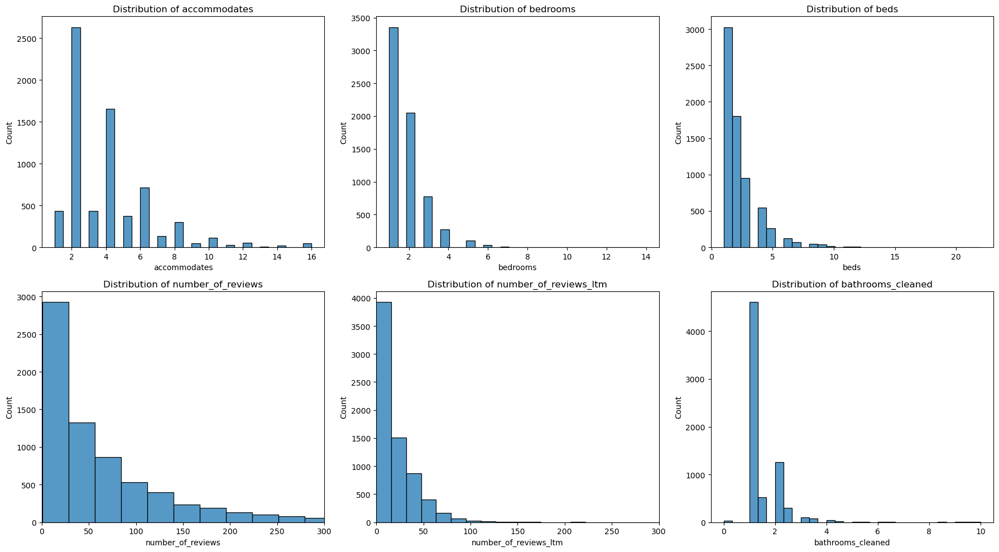

In [41]:
# Convert bathrooms to numeric if it's stored as string with text
train['bathrooms_cleaned'] = train['bathrooms'].astype(str).str.extract(r'(\d+\.?\d*)')
train['bathrooms_cleaned'] = pd.to_numeric(train['bathrooms_cleaned'], errors='coerce')

# Discrete variables
discrete_vars = [
    'accommodates', 'bedrooms', 'beds',
    'number_of_reviews', 'number_of_reviews_ltm', 'bathrooms_cleaned'
]

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for i, var in enumerate(discrete_vars):
    sns.histplot(train[var], bins=30, kde=False, ax=axes[i])
    axes[i].set_title(f"Distribution of {var}")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Count")

    if 'review' in var:
        axes[i].set_xlim(0, 300)
        axes[i].ticklabel_format(style='plain', axis='x')

plt.tight_layout()
plt.show()

In [42]:
# List of cleaned discrete variables (use 'bathrooms_cleaned' instead of original 'bathrooms')
discrete_vars_cleaned = [
    'accommodates', 'bedrooms', 'beds',
    'number_of_reviews', 'number_of_reviews_ltm', 'bathrooms_cleaned'
]

# Summary statistics
summary_stats = train[discrete_vars_cleaned].describe().T

# Add mode manually (describe doesn't include mode)
summary_stats['mode'] = train[discrete_vars_cleaned].mode().iloc[0]

# Display full summary
summary_stats[['min', '25%', '50%', 'mean', '75%', 'max', 'mode']]


,min,25%,50%,mean,75%,max,mode
accommodates,1.0,2.0,4.0,3.839714,5.0,16.0,2.0
bedrooms,1.0,1.0,1.0,1.785865,2.0,14.0,1.0
beds,1.0,1.0,2.0,2.263568,3.0,22.0,1.0
number_of_reviews,1.0,13.0,38.0,68.265429,92.0,836.0,1.0
number_of_reviews_ltm,0.0,3.0,12.0,19.309857,29.0,476.0,0.0
bathrooms_cleaned,0.0,1.0,1.0,1.377760,2.0,10.0,1.0


##### 1.5.6.2 Continuous Variables

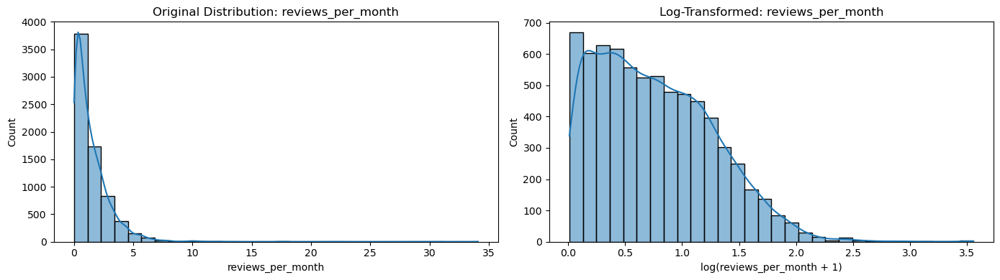

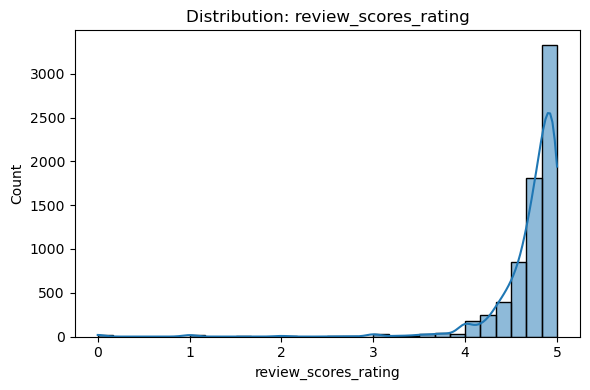

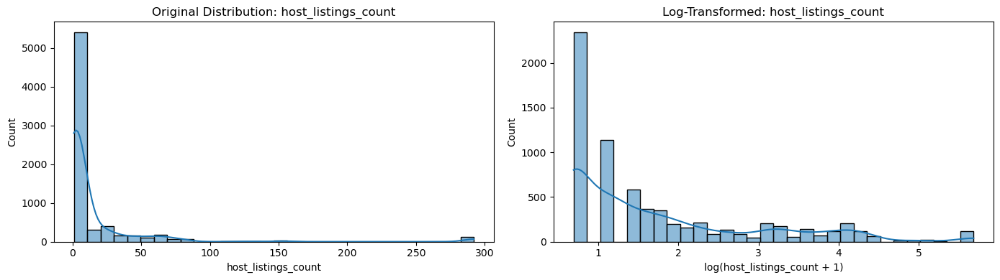

In [44]:
# Create log-transformed versions for skewed variables
train['log_reviews_per_month'] = np.log1p(train['reviews_per_month'])
train['log_host_listings_count'] = np.log1p(train['host_listings_count'])

# 1. Reviews per Month (original vs log-transformed)
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Original
sns.histplot(train['reviews_per_month'], bins=30, kde=True, ax=axes[0])
axes[0].set_title('Original Distribution: reviews_per_month')
axes[0].set_xlabel('reviews_per_month')
axes[0].set_ylabel('Count')

# Log-transformed
sns.histplot(train['log_reviews_per_month'], bins=30, kde=True, ax=axes[1])
axes[1].set_title('Log-Transformed: reviews_per_month')
axes[1].set_xlabel('log(reviews_per_month + 1)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()


# 2. Review Scores Rating (no transformation needed)
plt.figure(figsize=(6, 4))
sns.histplot(train['review_scores_rating'], bins=30, kde=True)
plt.title('Distribution: review_scores_rating')
plt.xlabel('review_scores_rating')
plt.ylabel('Count')
plt.tight_layout()
plt.show()


# 3. Host Listings Count (original vs log-transformed)
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Original
sns.histplot(train['host_listings_count'], bins=30, kde=True, ax=axes[0])
axes[0].set_title('Original Distribution: host_listings_count')
axes[0].set_xlabel('host_listings_count')
axes[0].set_ylabel('Count')

# Log-transformed
sns.histplot(train['log_host_listings_count'], bins=30, kde=True, ax=axes[1])
axes[1].set_title('Log-Transformed: host_listings_count')
axes[1].set_xlabel('log(host_listings_count + 1)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

This section explores key continuous variables in the dataset. These variables contain non-integer values such as ratings, averages, and proportions. Visualising their distributions helps us understand skewness, the presence of outliers, and whether transformations are necessary.

- **reviews_per_month** shows a strong right-skewed distribution, with most listings receiving very few monthly reviews. After applying a log transformation, the distribution becomes more symmetric and suitable for modelling.
  
- **review_scores_rating** is concentrated around the upper range (4.5–5.0), which is common in online review systems. A few outliers with very low ratings (<3.0) may indicate poor performance or unusual cases.

- **host_listings_count** also exhibits heavy right-skew. While most hosts manage only one or a few listings, a small number of hosts manage hundreds. A log transformation helps reduce the skewness and spreads the data more evenly.

These visual insights will guide feature preprocessing, particularly where log transformation or scaling may enhance model performance.

##### 1.5.6.3 Derived or Ratio-Based Metrics

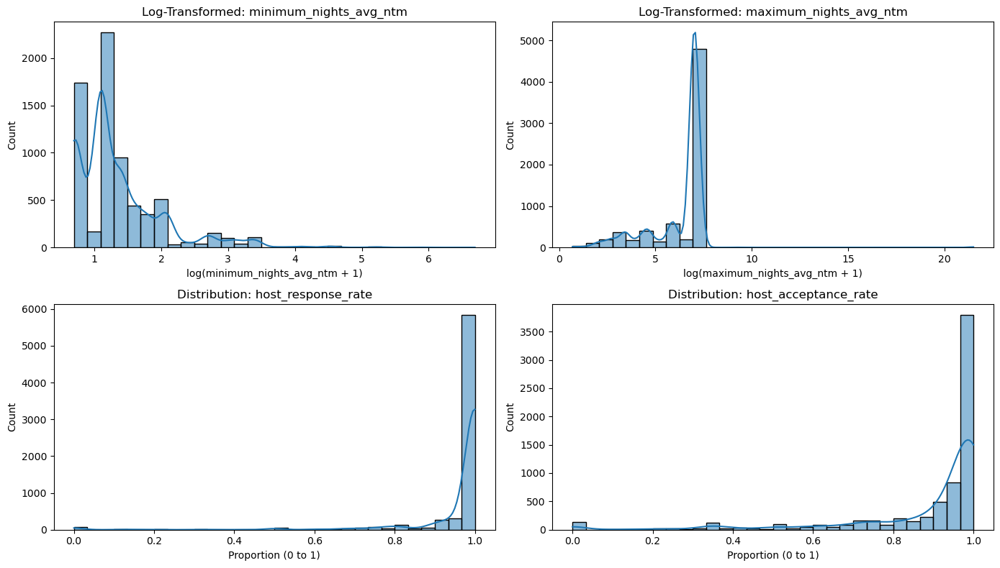

In [47]:
# Clean up if needed
for col in ['host_response_rate', 'host_acceptance_rate']:
    if train[col].dtype == 'object':
        train[col] = train[col].str.rstrip('%').astype('float') / 100

# Apply log transform to highly skewed ratio metrics
train['log_min_nights_avg'] = np.log1p(train['minimum_nights_avg_ntm'])
train['log_max_nights_avg'] = np.log1p(train['maximum_nights_avg_ntm'])

# Plot each variable
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

# Minimum nights avg (log)
sns.histplot(train['log_min_nights_avg'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title("Log-Transformed: minimum_nights_avg_ntm")
axes[0, 0].set_xlabel("log(minimum_nights_avg_ntm + 1)")

# Maximum nights avg (log)
sns.histplot(train['log_max_nights_avg'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title("Log-Transformed: maximum_nights_avg_ntm")
axes[0, 1].set_xlabel("log(maximum_nights_avg_ntm + 1)")

# Host response rate
sns.histplot(train['host_response_rate'], bins=30, kde=True, ax=axes[1, 0])
axes[1, 0].set_title("Distribution: host_response_rate")
axes[1, 0].set_xlabel("Proportion (0 to 1)")

# Host acceptance rate
sns.histplot(train['host_acceptance_rate'], bins=30, kde=True, ax=axes[1, 1])
axes[1, 1].set_title("Distribution: host_acceptance_rate")
axes[1, 1].set_xlabel("Proportion (0 to 1)")

plt.tight_layout()
plt.show()



These features are calculated averages or ratios that capture aggregated behaviours over time. Unlike simple counts, they summarise host or listing activity patterns. We explore their distributions to assess quality, variance, and potential need for transformation.

Key variables:
- `minimum_nights_avg_ntm` and `maximum_nights_avg_ntm`: represent nightly averages over a rolling window; values vary greatly and can be affected by outliers or inconsistent data entry.
- `host_response_rate` and `host_acceptance_rate`: initially stored as percentage strings, these features have been converted to float proportions between 0 and 1.


#### 1.5.7 Target Variable

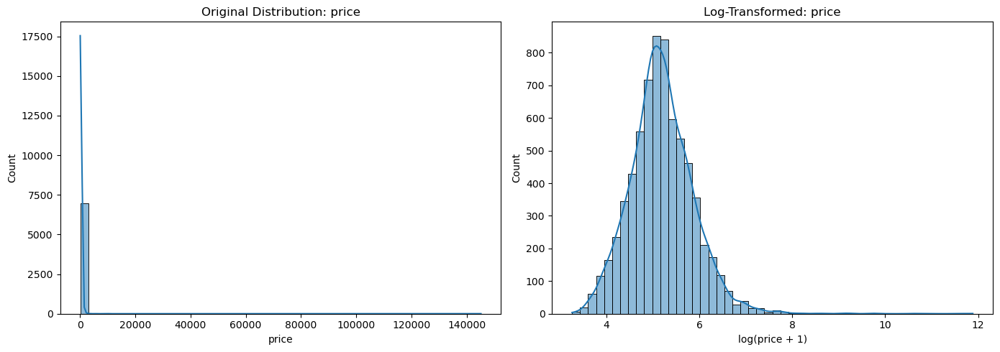

In [50]:
#Task 1 code here, insert more cells if required
# Convert price to float (if still object with '$' and ',')
if train['price'].dtype == 'object':
    train['price'] = train['price'].replace('[\$,]', '', regex=True).astype(float)

# Create log-transformed price
train['log_price'] = np.log1p(train['price'])

# Plot original and log-transformed price
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Original distribution
sns.histplot(train['price'], bins=50, kde=True, ax=axes[0])
axes[0].set_title('Original Distribution: price')
axes[0].set_xlabel('price')
axes[0].set_ylabel('Count')

# Log-transformed distribution
sns.histplot(train['log_price'], bins=50, kde=True, ax=axes[1])
axes[1].set_title('Log-Transformed: price')
axes[1].set_xlabel('log(price + 1)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

The `price` variable is the target of our predictive modelling task. As it represents the nightly listing price in Australian dollars, it is a continuous numerical feature. However, due to the nature of online rental platforms, the distribution of prices often exhibits strong right skewness, with a small number of listings charging extremely high rates.

To better understand this feature, we examined its distribution using histograms. As expected, most prices fall within the low to mid-range, while a few listings have significantly higher prices. This heavy-tailed distribution suggests that a log transformation may be beneficial prior to modelling in order to reduce skewness and improve the performance of regression models.

We also explored basic descriptive statistics (mean, median, quartiles, etc.) to understand the central tendency and spread. This analysis helps identify potential outliers and informs decisions about whether any capping or normalisation is needed.

### Appendix: Data Reset and Recovery

During the initial analysis and cleaning steps, most operations were applied only to the `train` dataset. These included variable type conversions, univariate analysis, and feature evaluations. However, the `test` dataset remained in its original, untouched state.

As a result, by the end of Task 1, the shape and structure of `train` and `test` had diverg, — with `train` having more columns due to the presence of the target variable `price` and several temporary changes applied for analysis purposes.

To ensure a consistent baseline before continuing to Task 2 (feature engineering and modelling), we reset both datasets to their original form using backup copies saved right after the upload. This guarantees that any transformations in the next tasks will be applied uniformly across both datass.

ets.input structure matters.

In [54]:
# Restore train and test to original copies
train = train_original.copy()
test = test_original.copy()

# Show the shapes
print("Train shape:", train.shape)
print("Test shape:", test.shape)


Train shape: (7000, 61)
Test shape: (3000, 60)


---

## Task 2: Data Cleaning, Missing Observations and Feature Engineering

- You must clearly explain all your answers in both the Markdown file. 

## 2. Data Cleaning, Missing Observations and Feature Engineering

### 2.0 Dataset Combination

In [58]:
# Separate target (price and ID) from training data
target = train[['ID', 'price']]
train = train.drop(columns=['price'])

# Combine train and test features
combined = pd.concat([train, test], axis=0).reset_index(drop=True)

# Show shapes
print("Train shape:", train.shape)
print("Test shape:", test.shape)
print("Combined shape:", combined.shape)
print("Target shape:", target.shape)


Train shape: (7000, 60)
Test shape: (3000, 60)
Combined shape: (10000, 60)
Target shape: (7000, 2)


### 2.1 Clear all numerical features

**Task 2, Question 1**: Clean **all** numerical features so that they can be used in training algorithms. For instance, `host_response_rate` feature is in object format containing both numerical values and text. Extract numerical values (or equivalently eliminate the text) so that the numerical values can be used as a regular feature.  
(2 marks)

#### 2.1.1 Convert Percentage Strings

In [62]:
# Clean percentage strings and convert to float
combined['host_response_rate'] = combined['host_response_rate'].str.rstrip('%').astype(float) / 100
combined['host_acceptance_rate'] = combined['host_acceptance_rate'].str.rstrip('%').astype(float) / 100

# Show cleaned head
display(combined[['host_response_rate', 'host_acceptance_rate']].head())


,host_response_rate,host_acceptance_rate
0,1.00,0.98
1,1.00,0.98
2,1.00,0.78
3,0.75,0.92
4,1.00,0.87


#### 2.1.2 Clean Currency Format

In [64]:
# Clean 'price' and add 'log_price' to target
target['price'] = target['price'].replace('[\$,]', '', regex=True).astype(float)
target['log_price'] = np.log1p(target['price'])

# Show head and shape
print(target.head())
print("Target shape:", target.shape)

   ID   price  log_price
0   0   132.0   4.890349
1   1    39.0   3.688879
2   2   270.0   5.602119
3   3  1000.0   6.908755
4   4   116.0   4.762174
Target shape: (7000, 3)


#### 2.1.3 Extract Numeric from Bathroom Field

In [66]:
# Show all unique values and their counts in 'bathrooms' column (including NaN)
unique_values = combined['bathrooms'].value_counts(dropna=False)

print("Unique values and counts in 'bathrooms':")
print(unique_values)

# Show total number of NaNs separately
num_nan = combined['bathrooms'].isna().sum()
print(f"\nTotal missing (NaN) in 'bathrooms': {num_nan}")


Unique values and counts in 'bathrooms':
bathrooms
1 bath               5094
2 baths              1804
1 shared bath         799
1 private bath        598
1.5 baths             478
2.5 baths             398
1.5 shared baths      228
3 baths               157
3.5 baths             107
2 shared baths         87
4 shared baths         38
2.5 shared baths       37
4 baths                31
0 shared baths         23
4.5 baths              21
3 shared baths         17
Shared half-bath       17
0 baths                11
5.5 shared baths        7
Half-bath               7
5 baths                 7
NaN                     6
3.5 shared baths        6
Private half-bath       6
5.5 baths               5
9.5 baths               2
5 shared baths          2
6.5 baths               2
6 baths                 1
9 baths                 1
10 baths                1
8.5 baths               1
7.5 baths               1
Name: count, dtype: int64

Total missing (NaN) in 'bathrooms': 6


In [67]:
# Show missing count after processing
missing_bathrooms = combined['bathrooms'].isna().sum()
print(f"Missing 'bathrooms' after processing: {missing_bathrooms}")

# Fill missing values with placeholder
combined['bathrooms'] = combined['bathrooms'].fillna('0 baths')

# Function to convert text to numeric score
def parse_bathroom_score(value):
    value = str(value).lower().strip()

    if 'shared half-bath' in value:
        return 0.25
    if 'private half-bath' in value or 'half-bath' in value:
        return 0.5

    if 'shared' in value:
        num = ''.join([c for c in value if c.isdigit() or c == '.'])
        try:
            return float(num) - 0.5
        except:
            return 0
    else:
        num = ''.join([c for c in value if c.isdigit() or c == '.'])
        try:
            return float(num)
        except:
            return 0

# Apply function
combined['bathroom_score'] = combined['bathrooms'].apply(parse_bathroom_score)

# Drop original column
combined = combined.drop(columns=['bathrooms'])

# Show head and shape
print(combined[['bathroom_score']].head())
print("Combined shape:", combined.shape)

Missing 'bathrooms' after processing: 6
   bathroom_score
0             1.0
1             0.5
2             2.5
3             2.5
4             1.0
Combined shape: (10000, 60)


### 2.2 New Features

**Task 2, Question 2** Create at least 4 new features from existing features which contain multiple items of information.   
(2 marks)

#### 2.2.1 Text Features (host_about, neighborhood_overview, description)

##### 2.2.1.1 host_about

In [72]:
# 1 — Extract Word Count and Average Sentence Length from host_about

# Fill missing values with empty string
combined['host_about'] = combined['host_about'].fillna('')

# Count number of words
combined['host_about_word_count'] = combined['host_about'].apply(lambda x: len(x.split()))

# Calculate average words per sentence
import re
def avg_words_per_sentence(text):
    sentences = re.split(r'[.!?]', text)
    sentences = [s.strip() for s in sentences if s.strip()]
    if len(sentences) == 0:
        return 0
    return len(text.split()) / len(sentences)

combined['host_about_avg_words_per_sentence'] = combined['host_about'].apply(avg_words_per_sentence)

# Show result
combined[['host_about_word_count', 'host_about_avg_words_per_sentence']].head()


,host_about_word_count,host_about_avg_words_per_sentence
0,21,21.000000
1,104,20.800000
2,252,25.200000
3,18,6.000000
4,52,17.333333


In [73]:
# 2 — Detect Emotion and Tone in host_about

def contains_any(text, keywords):
    text = text.lower()
    return int(any(word in text for word in keywords))

# Define keyword groups
welcome_words = [
    'welcome', 'enjoy', 'comfortable', 'relax', 'pleasure', 'memorable', 'warm', 
    'feel at home', 'happy to host', 'cozy', 'homely', 'lovely stay'
]

rules_words = [
    'no smoking', 'no party', 'quiet hours', 'rules', 'respect', 'please note', 
    'important', 'guidelines', 'terms', 'house rule', 'warning', 'reminder', 'strict'
]

professional_words = [
    'hospitality', 'cleanliness', 'guarantee', 'at your service', 'well equipped',
    'professional', 'dedicated', 'high standards', 'trained staff', 'experienced host',
    'attention to detail', 'premium', 'quality service'
]

# Apply detection
combined['host_about_mentions_welcome'] = combined['host_about'].apply(lambda x: contains_any(x, welcome_words))
combined['host_about_mentions_rules'] = combined['host_about'].apply(lambda x: contains_any(x, rules_words))
combined['host_about_mentions_professional'] = combined['host_about'].apply(lambda x: contains_any(x, professional_words))

# Show results
print("Welcome Terms Mentioned:")
print(combined['host_about_mentions_welcome'].value_counts())

print("\nRules/Warnings Mentioned:")
print(combined['host_about_mentions_rules'].value_counts())

print("\nProfessional Terms Mentioned:")
print(combined['host_about_mentions_professional'].value_counts())

Welcome Terms Mentioned:
host_about_mentions_welcome
0    6745
1    3255
Name: count, dtype: int64

Rules/Warnings Mentioned:
host_about_mentions_rules
0    9231
1     769
Name: count, dtype: int64

Professional Terms Mentioned:
host_about_mentions_professional
0    8876
1    1124
Name: count, dtype: int64


In [74]:
# 3 — Detect Travel Experience and Local Knowledge

# Define keyword groups
travel_keywords = [
    'travel', 'traveled', 'travelling', 'airbnb guest', 'explore', 'backpacking', 
    'road trip', 'visited', 'adventure', 'journey', 'wanderlust', 'vacation', 
    'hosted around the world', 'met people globally'
]

local_keywords = [
    'local', 'know the area', 'melbourne', 'tips', 'recommendations', 'guidebook',
    'local gems', 'born and raised', 'neighbourhood expert', 'hidden spots',
    'area knowledge', 'close to everything', 'inside info'
]

# Apply detection
combined['host_about_mentions_travel_experience'] = combined['host_about'].apply(lambda x: contains_any(x, travel_keywords))
combined['host_about_mentions_local_knowledge'] = combined['host_about'].apply(lambda x: contains_any(x, local_keywords))

# Show results
print("Travel Experience Mentioned:")
print(combined['host_about_mentions_travel_experience'].value_counts())

print("\nLocal Knowledge Mentioned:")
print(combined['host_about_mentions_local_knowledge'].value_counts())

Travel Experience Mentioned:
host_about_mentions_travel_experience
0    6691
1    3309
Name: count, dtype: int64

Local Knowledge Mentioned:
host_about_mentions_local_knowledge
0    6577
1    3423
Name: count, dtype: int64


In [75]:
# 4 — Detect Guest Support Content in host_about

def contains_any(text, keywords):
    text = text.lower()
    return int(any(word in text for word in keywords))

# Guest support-related keywords
guest_support_keywords = [
    'hospitality', 'cleanliness', 'guarantee', 'at your service', 'well equipped',
    'comfortable stay', 'quality service', 'premium experience', 'dedicated host',
    'everything you need', 'fully furnished', 'we provide', 'fresh linen',
    'stocked kitchen', 'prepared for you', 'equipped for', 'make your stay', 'laundered towels',
    'professionally cleaned', 'spotless', 'luxurious feel', 'comfortable beds',
    'towels provided', 'toiletries included', 'starter pack', 'kitchen essentials',
    'ready to go', 'turnkey', 'move-in ready', 'essential items provided',
    'great amenities', 'personal touches', 'attention to detail', 'super clean',
    'great for families', 'business ready', 'welcoming space', 'warm environment',
    'cosy place', 'stress-free', 'hassle-free stay', 'make yourself at home'
]

# Apply detection
combined['host_about_mentions_guest_support'] = combined['host_about'].apply(
    lambda x: contains_any(x, guest_support_keywords)
)

# Show result
print(combined['host_about_mentions_guest_support'].value_counts())

host_about_mentions_guest_support
0    9067
1     933
Name: count, dtype: int64


In [76]:
# 5 — Simple Rule-Based Language Detection for host_about

english_vocab = set(words.words())

def detect_language(text):
    text = text.lower()
    tokens = re.findall(r'\b[a-z]{2,}\b', text)  # ambil kata alphabet aja, panjang ≥2
    if not tokens:
        return 'mixed_or_other'
    
    english_count = sum(1 for word in tokens if word in english_vocab)
    proportion = english_count / len(tokens)

    return 'english' if proportion >= 0.7 else 'mixed_or_other'

combined['host_about_language'] = combined['host_about'].apply(detect_language)

# Show result
print(combined['host_about_language'].value_counts())

host_about_language
english           5855
mixed_or_other    4145
Name: count, dtype: int64


##### 2.2.1.2 neighborhood_overview

In [78]:
# 1 — Extract Word Count and Average Sentence Length from neighborhood_overview

# Fill missing values
combined['neighborhood_overview'] = combined['neighborhood_overview'].fillna('')

# Word count
combined['neigh_overview_word_count'] = combined['neighborhood_overview'].apply(lambda x: len(x.split()))

# Average words per sentence
import re

def avg_words_per_sentence(text):
    sentences = re.split(r'[.!?]', text)
    sentences = [s.strip() for s in sentences if s.strip()]
    if len(sentences) == 0:
        return 0
    return len(text.split()) / len(sentences)

combined['neigh_overview_avg_words_per_sentence'] = combined['neighborhood_overview'].apply(avg_words_per_sentence)

# Show result
combined[['neigh_overview_word_count', 'neigh_overview_avg_words_per_sentence']].head()


,neigh_overview_word_count,neigh_overview_avg_words_per_sentence
0,35,11.666667
1,144,20.571429
2,0,0.000000
3,0,0.000000
4,15,15.000000


In [79]:
# 2 — Detect Strategic Location & Attractions in neighborhood_overview

def contains_any(text, keywords):
    text = text.lower()
    return int(any(word in text for word in keywords))

location_keywords = {
    'mentions_city_centre': [
        'cbd', 'city center', 'city centre', 'downtown', 'central business district',
        'heart of the city', 'close to city', 'walk to city'
    ],
    'mentions_tram_or_train': [
        'tram', 'station', 'train', 'metro', 'light rail', 'public transport',
        'transport nearby', 'bus stop', 'commute', 'skybus', 'line'
    ],
    'mentions_parks': [
        'park', 'garden', 'botanical', 'green space', 'reserve', 'nature walk',
        'recreational area', 'playground', 'urban forest', 'open space'
    ],
    'mentions_beach': [
        'beach', 'bay', 'ocean', 'coast', 'seaside', 'shore', 'waterfront',
        'harbour', 'pier', 'swimming beach'
    ],
    'mentions_university': [
        'university', 'campus', 'melbourne uni', 'rmit', 'monash', 'deakin',
        'la trobe', 'student area', 'near uni', 'close to university'
    ],
    'mentions_malls_or_shops': [
        'mall', 'shopping', 'retail', 'boutique', 'market', 'supermarket',
        'grocery', 'convenience store', 'department store', 'emporium'
    ],
    'mentions_cafes_or_bars': [
        'cafe', 'coffee', 'bar', 'restaurant', 'eatery', 'food court',
        'bistro', 'wine bar', 'pub', 'brunch spot', 'dining'
    ],
    'mentions_airport_or_skybus': [
        'airport', 'skybus', 'tullamarine', 'airport shuttle', 'air terminal',
        'direct to airport', 'fly in', 'express to airport', 'avalanche bus'
    ]
}

# Apply feature extraction
for feature, keywords in location_keywords.items():
    combined[feature] = combined['neighborhood_overview'].apply(lambda x: contains_any(x, keywords))

# Show total 1s per feature
print("Total listings mentioning each location/attraction:")
print(combined[list(location_keywords.keys())].sum())


Total listings mentioning each location/attraction:
mentions_city_centre          1767
mentions_tram_or_train        2818
mentions_parks                2859
mentions_beach                1283
mentions_university            451
mentions_malls_or_shops       3390
mentions_cafes_or_bars        4374
mentions_airport_or_skybus     274
dtype: int64


In [80]:
# 3 — Detect Environment Characteristics in neighborhood_overview

# Define keyword sets
environment_keywords = {
    'mentions_safe_or_quiet': [
        'safe', 'quiet', 'peaceful', 'calm', 'secure', 'relaxing', 'low noise', 'residential', 
        'serene', 'tranquil', 'private', 'secluded', 'safe for kids', 'family-oriented', 
        'green area', 'leafy', 'low traffic', 'low crime'
    ],
    'mentions_lively_or_trendy': [
        'vibrant', 'lively', 'trendy', 'nightlife', 'bars', 'cafes', 'artsy', 'hipster', 'busy',
        'creative vibe', 'bustling', 'young crowd', 'cultural', 'active', 'upbeat', 'energetic',
        'fun', 'cool neighborhood', 'social scene', 'music venue', 'hotspot', 'popular area'
    ],
    'mentions_family_friendly': [
        'family', 'children', 'kids', 'family-friendly', 'playground', 'school zone', 
        'safe for kids', 'ideal for families', 'parks for kids', 'great for families', 
        'child friendly', 'perfect for families', 'family neighbourhood', 'family atmosphere'
    ]
}

# Apply detection function
for feature, keywords in environment_keywords.items():
    combined[feature] = combined['neighborhood_overview'].apply(lambda x: contains_any(x, keywords))

# Show total counts
print("Total listings mentioning environment characteristics:")
print(combined[list(environment_keywords.keys())].sum())

Total listings mentioning environment characteristics:
mentions_safe_or_quiet       1656
mentions_lively_or_trendy    3198
mentions_family_friendly      491
dtype: int64


In [81]:
# 4 — Simple Language Detection in neighborhood_overview

# Make sure column is filled
combined['neighborhood_overview'] = combined['neighborhood_overview'].fillna('')

# Reuse english vocabulary from nltk
def detect_language(text):
    text = text.lower()
    tokens = re.findall(r'\b[a-z]{2,}\b', text)
    if not tokens:
        return 'mixed_or_other'
    
    english_count = sum(1 for word in tokens if word in english_vocab)
    proportion = english_count / len(tokens)

    return 'english' if proportion >= 0.7 else 'mixed_or_other'

combined['neigh_overview_language'] = combined['neighborhood_overview'].apply(detect_language)

# Show total counts
print(combined['neigh_overview_language'].value_counts())


neigh_overview_language
english           5370
mixed_or_other    4630
Name: count, dtype: int64


##### 2.2.1.3 description

In [83]:
# 1 — Extract Word Count, Avg Sentence Length, and HTML Tag Count from description

# Fill missing values
combined['description'] = combined['description'].fillna('')

# Word count
combined['description_word_count'] = combined['description'].apply(lambda x: len(x.split()))

# Average words per sentence
import re

def avg_words_per_sentence(text):
    sentences = re.split(r'[.!?]', text)
    sentences = [s.strip() for s in sentences if s.strip()]
    if len(sentences) == 0:
        return 0
    return len(text.split()) / len(sentences)

combined['description_avg_words_per_sentence'] = combined['description'].apply(avg_words_per_sentence)

# HTML tag count (e.g. <br>, <b>)
combined['description_html_tag_count'] = combined['description'].apply(lambda x: len(re.findall(r'<[^>]+>', x)))

# Show result
combined[['description_word_count', 'description_avg_words_per_sentence', 'description_html_tag_count']].head()


,description_word_count,description_avg_words_per_sentence,description_html_tag_count
0,162,16.200000,13
1,177,19.666667,8
2,168,14.000000,7
3,162,16.200000,28
4,170,18.888889,9


In [84]:
# 2 — Detect Target Audience from description

# Extended keyword lists per target group
target_keywords = {
    'mentions_family_friendly': [
        'family', 'families', 'children', 'kids', 'family-friendly', 
        'safe for kids', 'great for families', 'child friendly', 
        'perfect for family', 'baby cot', 'family vacation', 'kid friendly'
    ],
    'mentions_couples': [
        'couple', 'romantic', 'cozy for two', 'ideal for couples', 
        'perfect for two', 'honeymoon', 'intimate', 'private retreat'
    ],
    'mentions_business_travel': [
        'business trip', 'work trip', 'business traveller', 'workspace', 
        'desk', 'office', 'business ready', 'working remotely', 
        'remote work', 'ideal for business', 'corporate travel', 
        'fast wifi', 'quiet work space'
    ],
    'mentions_longstay_ready': [
        'long term', 'extended stay', 'monthly stay', 'stay for weeks', 
        'perfect for long stay', 'ideal for long term', 'weekly discount', 
        'stay longer', 'fully equipped for long term', 'home away from home'
    ]
}

# Helper function
def contains_any(text, keywords):
    text = text.lower()
    return int(any(word in text for word in keywords))

# Apply to each feature
for feature, keywords in target_keywords.items():
    combined[feature] = combined['description'].apply(lambda x: contains_any(x, keywords))

# Show result
print("Total listings mentioning each target audience:")
print(combined[list(target_keywords.keys())].sum())

Total listings mentioning each target audience:
mentions_family_friendly    2128
mentions_couples            1284
mentions_business_travel    1340
mentions_longstay_ready      517
dtype: int64


In [85]:
# 3 — Extract Value & Feature Highlights from description

# Define expanded keyword lists
value_keywords = {
    'mentions_freebies': [
        'free wifi', 'free internet', 'free parking', 'complimentary', 'included', 
        'no extra cost', 'free laundry', 'free breakfast', 'free snacks', 'gratis', 
        'complimentary toiletries', 'no charge', 'inclusive of', 'comes with'
    ],
    'mentions_fully_equipped': [
        'fully equipped', 'equipped kitchen', 'all essentials', 'ready to use', 
        'well equipped', 'complete amenities', 'has everything', 'fully stocked', 
        'full kitchen', 'fully furnished', 'has all you need', 'everything provided'
    ],
    'mentions_host_promotion': [
        'you’ll love', 'you will enjoy', 'we guarantee', 'perfect for your stay', 
        'amazing experience', 'we’re sure', 'feel at home', 'like your own home', 
        'unforgettable stay', 'we welcome you', 'your home away from home', 
        'make yourself comfortable', 'great choice', 'top pick'
    ]
}

# Helper function
def contains_any(text, keywords):
    text = text.lower()
    return int(any(word in text for word in keywords))

# Apply detection
for feature, keywords in value_keywords.items():
    combined[feature] = combined['description'].apply(lambda x: contains_any(x, keywords))

# Show results
print("Total listings mentioning each value/feature highlight:")
print(combined[list(value_keywords.keys())].sum())


Total listings mentioning each value/feature highlight:
mentions_freebies          1951
mentions_fully_equipped    2930
mentions_host_promotion     488
dtype: int64


In [86]:
# 4 — Detect Vibe & Listing Style from description

# Define keyword dictionary
style_keywords = {
    'mentions_luxury': [
        'luxury', 'luxurious', 'high-end', 'premium', 'elegant', 
        'exclusive', '5-star', 'lavish', 'designer', 'prestigious'
    ],
    'mentions_modern': [
        'modern', 'contemporary', 'newly built', 'updated', 'renovated',
        'stylish', 'state-of-the-art', 'recently refurbished'
    ],
    'mentions_cozy_minimalist': [
        'cozy', 'minimalist', 'warm', 'inviting', 'clean design', 
        'neat and simple', 'homey', 'comfortable', 'tidy space', 'compact but functional'
    ]
}

# Helper function
def contains_any(text, keywords):
    text = text.lower()
    return int(any(word in text for word in keywords))

# Apply detection
for feature, keywords in style_keywords.items():
    combined[feature] = combined['description'].apply(lambda x: contains_any(x, keywords))

# Show result
print("Total listings mentioning each listing style/vibe:")
print(combined[list(style_keywords.keys())].sum())


Total listings mentioning each listing style/vibe:
mentions_luxury             1941
mentions_modern             3941
mentions_cozy_minimalist    2901
dtype: int64


In [87]:
# 5 — Detect Nearby Public Transport Mentions from description

# Define updated keyword list
transport_keywords = {
    'mentions_station_nearby': [
        'train station', 'station nearby', 'close to station', 'near station', 
        'walking distance to station', 'steps from station'
    ],
    'mentions_tram_stop_nearby': [
        'tram stop', 'tram line', 'on tram route', 'tram just outside', 
        'tram at the doorstep', 'next to tram'
    ],
    'mentions_bus_stop_nearby': [
        'bus stop', 'bus route', 'bus line', 'bus right outside', 
        'near bus stop', 'bus nearby'
    ],
    'mentions_nearby_transport_hub': [
        'southern cross', 'flinders street', 'flinders st', 
        'Melbourne Central Station', 'melbourne central', 'transport hub'
    ]
}

# Reuse helper function
def contains_any(text, keywords):
    text = text.lower()
    return int(any(word in text for word in keywords))

# Create binary features
for feature, keywords in transport_keywords.items():
    combined[feature] = combined['description'].apply(lambda x: contains_any(x, keywords))

# Show result
print("Total listings mentioning each nearby transport indicator:")
print(combined[list(transport_keywords.keys())].sum())


Total listings mentioning each nearby transport indicator:
mentions_station_nearby          1072
mentions_tram_stop_nearby         664
mentions_bus_stop_nearby          329
mentions_nearby_transport_hub    1102
dtype: int64


In [88]:
# 6 — Detect Landmark Mentions (case-insensitive, exact word)

def contains_any(text, keywords):
    return int(any(re.search(r'\b' + re.escape(word) + r'\b', text, flags=re.IGNORECASE) for word in keywords))

landmark_keywords = {
    'mentions_mcg': ['mcg', 'melbourne cricket ground'],
    'mentions_ngv': ['ngv', 'national gallery of victoria'],
    'mentions_crown': ['crown casino', 'crown melbourne', 'crown complex'],
    'mentions_federation_square': ['federation square', 'fed square'],
    'mentions_queen_victoria_market': ['queen victoria market', 'qvm'],
    'mentions_rod_laver_arena': ['rod laver arena'],
    'mentions_eureka_tower': ['eureka tower'],
    'mentions_melbourne_zoo': ['melbourne zoo'],
    'mentions_museum': ['melbourne museum', 'museum victoria'],
    'mentions_bourke_street_mall': ['bourke street mall']
}

for feature, keywords in landmark_keywords.items():
    combined[feature] = combined['description'].apply(lambda x: contains_any(x, keywords))

print("Total listings mentioning each landmark:")
print(combined[list(landmark_keywords.keys())].sum())

Total listings mentioning each landmark:
mentions_mcg                      505
mentions_ngv                       63
mentions_crown                    558
mentions_federation_square        171
mentions_queen_victoria_market    262
mentions_rod_laver_arena          126
mentions_eureka_tower              25
mentions_melbourne_zoo             46
mentions_museum                    63
mentions_bourke_street_mall        72
dtype: int64


#### 2.2.2 Date Time (host_since, first_review, last_review)

In [90]:
# Convert to datetime format
combined['host_since'] = pd.to_datetime(combined['host_since'], errors='coerce')
combined['first_review'] = pd.to_datetime(combined['first_review'], errors='coerce')
combined['last_review'] = pd.to_datetime(combined['last_review'], errors='coerce')

# Reference date: max date across the three columns
reference_date = max(
    combined['host_since'].max(),
    combined['first_review'].max(),
    combined['last_review'].max()
)

print("Reference date used for calculation:", reference_date.date())

# Feature 1: How long the host has been active (in days)
combined['host_days_active'] = (reference_date - combined['host_since']).dt.days

# Feature 2: Days since last review
combined['days_since_last_review'] = (reference_date - combined['last_review']).dt.days

# Feature 3: Duration of review lifetime (from first to last review)
combined['listing_review_lifetime_days'] = (combined['last_review'] - combined['first_review']).dt.days

# Optional: Extract host account year and month
combined['host_start_year'] = combined['host_since'].dt.year
combined['host_start_month'] = combined['host_since'].dt.month

# Show sample output
combined[['host_since', 'host_days_active', 
          'first_review', 'last_review', 
          'days_since_last_review', 
          'listing_review_lifetime_days']].head()

Reference date used for calculation: 2023-03-23


,host_since,host_days_active,first_review,last_review,days_since_last_review,listing_review_lifetime_days
0,2013-03-16,3659,2013-03-29,2023-02-18,33.0,3613.0
1,2009-09-16,4936,2013-01-12,2023-03-08,15.0,3707.0
2,2011-11-28,4133,2015-07-06,2022-06-13,283.0,2534.0
3,2010-06-13,4666,2011-10-16,2012-01-27,4073.0,103.0
4,2010-07-12,4637,2010-11-24,2023-03-03,20.0,4482.0


#### 2.2.3 Availability & Stay Length Rules

In [92]:
# Convert has_availability to binary
combined['has_availability'] = combined['has_availability'].map({'t': 1, 'f': 0})

# Binary indicators
combined['is_available_yearround'] = (combined['availability_365'] >= 300).astype(int)
combined['is_short_stay_allowed'] = (combined['minimum_nights'] <= 2).astype(int)
combined['is_long_stay_allowed'] = (combined['maximum_nights'] >= 30).astype(int)

# Ratio features
combined['availability_ratio_30'] = combined['availability_30'] / 30
combined['availability_ratio_365'] = combined['availability_365'] / 365
combined['booking_flexibility_index'] = combined['maximum_nights'] / combined['minimum_nights'].replace(0, 1)

# Aggregates
combined['avg_min_stay'] = combined[['minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_nights_avg_ntm']].mean(axis=1)
combined['avg_max_stay'] = combined[['minimum_maximum_nights', 'maximum_maximum_nights', 'maximum_nights_avg_ntm']].mean(axis=1)

# Show results
combined[['is_available_yearround',
          'is_short_stay_allowed',
          'is_long_stay_allowed',
          'availability_ratio_30',
          'availability_ratio_365',
          'booking_flexibility_index',
          'avg_min_stay',
          'avg_max_stay']].head()

,is_available_yearround,is_short_stay_allowed,is_long_stay_allowed,availability_ratio_30,availability_ratio_365,booking_flexibility_index,avg_min_stay,avg_max_stay
0,0,1,0,0.000000,0.032877,7.00,2.0,1125.0
1,0,0,0,0.000000,0.306849,6.75,4.0,27.0
2,1,1,1,1.000000,1.000000,182.50,2.0,365.0
3,1,1,1,1.000000,1.000000,730.00,1.0,730.0
4,1,1,0,0.566667,0.854795,14.00,1.0,14.0


#### 2.2.4 Review Columns

In [94]:
# Fill missing review scores with 0
review_columns = [
    'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
    'review_scores_checkin', 'review_scores_communication',
    'review_scores_location', 'review_scores_value'
]
combined[review_columns] = combined[review_columns].fillna(0)

# Flag: whether the listing has review scores available
combined['has_review_scores'] = (combined['review_scores_rating'] > 0).astype(int)

# Calculate average and standard deviation of all review score aspects
combined['review_scores_mean'] = combined[review_columns].mean(axis=1)
combined['review_scores_std'] = combined[review_columns].std(axis=1)

# Calculate how many days since last review (based on fixed data snapshot date)
cutoff_date = pd.to_datetime('2023-03-23')
combined['last_review'] = pd.to_datetime(combined['last_review'], errors='coerce')
combined['review_recency_days'] = (cutoff_date - combined['last_review']).dt.days

# Binary flag: was there a recent review in the past 30 days?
combined['has_recent_review_30d'] = (combined['review_recency_days'] <= 30).astype(int)

# Ratios of recent reviews (past 12 months and past 30 days)
combined['reviews_ltm_ratio'] = combined['number_of_reviews_ltm'] / combined['number_of_reviews']
combined['reviews_l30d_ratio'] = combined['number_of_reviews_l30d'] / combined['number_of_reviews']

# Monthly review frequency: how many reviews per month across listing lifetime
combined['listing_review_lifetime_days'] = (
    pd.to_datetime(combined['last_review']) - pd.to_datetime(combined['first_review'])
).dt.days
combined['listing_review_lifetime_days'] = combined['listing_review_lifetime_days'].fillna(0).replace(0, 1)  # avoid divide by zero
combined['reviews_freq_month'] = combined['number_of_reviews'] / (combined['listing_review_lifetime_days'] / 30)

# Show only the new features
combined[[
    'has_review_scores', 'review_scores_mean', 'review_scores_std',
    'review_recency_days', 'has_recent_review_30d',
    'reviews_ltm_ratio', 'reviews_l30d_ratio', 'reviews_freq_month'
]].head()


,has_review_scores,review_scores_mean,review_scores_std,review_recency_days,has_recent_review_30d,reviews_ltm_ratio,reviews_l30d_ratio,reviews_freq_month
0,1,4.911429,0.048795,33.0,0,0.049933,0.001350,6.152782
1,1,4.535714,0.261078,15.0,1,0.147929,0.017751,1.367683
2,1,4.787143,0.157661,283.0,0,0.250000,0.000000,0.094712
3,1,4.285714,0.393398,4073.0,0,0.000000,0.000000,0.582524
4,1,4.908571,0.039761,20.0,1,0.182243,0.018692,1.432396


#### 2.2.5 Listing Info

In [96]:
# 1 — Binary flag: does host have more than 1 listing?
combined['has_multiple_listings'] = (combined['calculated_host_listings_count'] > 1).astype(int)

# 2 — Host specialisation type based on dominant listing category
def classify_host_type(row):
    counts = {
        'entire_home': row['calculated_host_listings_count_entire_homes'],
        'private_room': row['calculated_host_listings_count_private_rooms'],
        'shared_room': row['calculated_host_listings_count_shared_rooms']
    }
    max_type = max(counts, key=counts.get)
    if list(counts.values()).count(counts[max_type]) > 1:
        return 'mixed'
    return max_type

combined['host_specialisation_type'] = combined.apply(classify_host_type, axis=1)

# 3 — Ratio of entire homes over total listings (to estimate professionalism)
combined['multi_listing_ratio_entire_home'] = (
    combined['calculated_host_listings_count_entire_homes'] / combined['calculated_host_listings_count']
).fillna(0)

# Show new columns only
combined[['has_multiple_listings', 'host_specialisation_type', 'multi_listing_ratio_entire_home']].head()


,has_multiple_listings,host_specialisation_type,multi_listing_ratio_entire_home
0,1,entire_home,1.0
1,0,private_room,0.0
2,1,entire_home,1.0
3,0,private_room,0.0
4,0,entire_home,1.0


#### 2.2.6 Location

##### 2.2.6.1 Base Map

In [99]:
# Base map
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=10)

# -----------------------------
# 1. Airbnb Listings (gray dots)
# -----------------------------
marker_cluster = MarkerCluster().add_to(melbourne_map)
for _, row in combined[['latitude', 'longitude']].dropna().iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color='gray',
        fill=True,
        fill_opacity=0.3
    ).add_to(marker_cluster)

# -----------------------------
# 2. Major City Landmarks (Red)
# -----------------------------
major_landmarks = [
    {'name': 'MCG', 'lat': -37.8199, 'lon': 144.9834},
    {'name': 'Flinders St Station', 'lat': -37.8183, 'lon': 144.9671},
    {'name': 'Queen Vic Market', 'lat': -37.8078, 'lon': 144.9564},
    {'name': 'Federation Square', 'lat': -37.8179, 'lon': 144.9690},
    {'name': 'Crown Casino', 'lat': -37.8230, 'lon': 144.9580},
    {'name': 'Royal Botanic Gardens', 'lat': -37.8304, 'lon': 144.9796},
]

for loc in major_landmarks:
    folium.Marker(
        location=[loc['lat'], loc['lon']],
        popup=loc['name'],
        icon=folium.Icon(color='red', icon='star')
    ).add_to(melbourne_map)

# ------------------------------------------
# 3. Inner Regional Attractions (Blue icons)
# ------------------------------------------
inner_regional_landmarks = [
    {'name': 'St Kilda Beach', 'lat': -37.8676, 'lon': 144.9731},
    {'name': 'Chapel Street', 'lat': -37.8465, 'lon': 144.9934},
    {'name': 'Footscray Market', 'lat': -37.8003, 'lon': 144.9021},
    {'name': 'Box Hill Central', 'lat': -37.8185, 'lon': 145.1254},
    {'name': 'Coburg Lake Reserve', 'lat': -37.7355, 'lon': 144.9637},
    {'name': 'Highpoint Shopping Centre', 'lat': -37.7720, 'lon': 144.8927}
]

for loc in inner_regional_landmarks:
    folium.Marker(
        location=[loc['lat'], loc['lon']],
        popup=loc['name'],
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(melbourne_map)

# ----------------------------------------
# 4. Outer Grid Tourism Clusters (Green)
# ----------------------------------------
grid_landmarks = [
    {'name': 'Geelong Waterfront', 'lat': -38.1471, 'lon': 144.3607},
    {'name': 'Werribee Open Range Zoo', 'lat': -37.9363, 'lon': 144.6555},
    {'name': 'Frankston Beach', 'lat': -38.1415, 'lon': 145.1248},
    {'name': 'Mornington Peninsula Hot Springs', 'lat': -38.3580, 'lon': 144.8290},
    {'name': 'Phillip Island Penguins', 'lat': -38.4851, 'lon': 145.2374},
    {'name': 'Yarra Valley Wineries', 'lat': -37.6550, 'lon': 145.3750},
    {'name': 'Dandenong Ranges', 'lat': -37.8661, 'lon': 145.3483},
    {'name': 'Healesville Sanctuary', 'lat': -37.6539, 'lon': 145.5159},
    {'name': 'Sunbury', 'lat': -37.5806, 'lon': 144.7130},
    {'name': 'Kinglake National Park', 'lat': -37.5271, 'lon': 145.3566},
    {'name': 'Ballarat Town Centre', 'lat': -37.5622, 'lon': 143.8503}
]

for loc in grid_landmarks:
    folium.Marker(
        location=[loc['lat'], loc['lon']],
        popup=loc['name'],
        icon=folium.Icon(color='green', icon='ok-sign')
    ).add_to(melbourne_map)

# Show map
melbourne_map


##### 2.2.6.2 Distance to Landmark

In [101]:
# Combine all landmarks
all_landmarks = major_landmarks + inner_regional_landmarks + grid_landmarks

# Function to calculate minimum distance to a group of landmarks
def min_distance(row, landmarks):
    return min([
        geodesic((row['latitude'], row['longitude']), (lm['lat'], lm['lon'])).km 
        for lm in landmarks
    ])

# Apply to each listing
combined['distance_to_major_landmarks'] = combined.apply(lambda row: min_distance(row, major_landmarks), axis=1)
combined['distance_to_inner_landmarks'] = combined.apply(lambda row: min_distance(row, inner_regional_landmarks), axis=1)
combined['distance_to_grid_landmarks'] = combined.apply(lambda row: min_distance(row, grid_landmarks), axis=1)
combined['distance_to_any_landmark'] = combined.apply(lambda row: min_distance(row, all_landmarks), axis=1)

# Optional: show new features
print(combined[['distance_to_major_landmarks', 'distance_to_inner_landmarks', 'distance_to_grid_landmarks', 'distance_to_any_landmark']].head())

   distance_to_major_landmarks  distance_to_inner_landmarks  \
0                     0.596849                     2.921979   
1                     5.060336                     3.666930   
2                    37.398313                    25.569037   
3                     0.371118                     3.624354   
4                    40.422612                    32.496368   

   distance_to_grid_landmarks  distance_to_any_landmark  
0                   31.930413                  0.596849  
1                   31.249150                  3.666930  
2                    5.965039                  5.965039  
3                   30.193742                  0.371118  
4                   21.015232                 21.015232  


In [102]:
def get_min_distance(row, landmark_group):
    return min([geodesic((row['latitude'], row['longitude']), (loc['lat'], loc['lon'])).km for loc in landmark_group])

combined['distance_to_red'] = combined.apply(lambda row: get_min_distance(row, major_landmarks), axis=1)
combined['distance_to_blue'] = combined.apply(lambda row: get_min_distance(row, inner_regional_landmarks), axis=1)
combined['distance_to_green'] = combined.apply(lambda row: get_min_distance(row, grid_landmarks), axis=1)

print(combined[['distance_to_red', 'distance_to_blue', 'distance_to_green']].head())

   distance_to_red  distance_to_blue  distance_to_green
0         0.596849          2.921979          31.930413
1         5.060336          3.666930          31.249150
2        37.398313         25.569037           5.965039
3         0.371118          3.624354          30.193742
4        40.422612         32.496368          21.015232


##### 2.2.6.3 Distance to Public Transport

In [104]:
# Convert degrees to radians
combined_coords = np.radians(combined[['latitude', 'longitude']].values)
bus_coords = np.radians(transport_df[transport_df['mode'] == 'bus'][['lat', 'lon']].values)
train_coords = np.radians(transport_df[transport_df['mode'] == 'train'][['lat', 'lon']].values)
tram_coords = np.radians(transport_df[transport_df['mode'] == 'tram'][['lat', 'lon']].values)

# Build BallTrees
bus_tree = BallTree(bus_coords, metric='haversine')
train_tree = BallTree(train_coords, metric='haversine')
tram_tree = BallTree(tram_coords, metric='haversine')

# Query for nearest distances (returns radians, multiply by Earth's radius to get km)
combined['distance_to_bus'] = bus_tree.query(combined_coords, k=1)[0] * 6371  # Earth's radius
combined['distance_to_train'] = train_tree.query(combined_coords, k=1)[0] * 6371
combined['distance_to_tram'] = tram_tree.query(combined_coords, k=1)[0] * 6371

# Optional: Preview the first few results
print(combined[['distance_to_bus', 'distance_to_train', 'distance_to_tram']].head())

   distance_to_bus  distance_to_train  distance_to_tram
0         1.136741           1.288922          0.742874
1         1.444823           3.011803          1.656438
2         1.903179           1.692683          1.520465
3         2.229850           1.271552          1.321540
4         2.291828           0.624254          0.993435


##### 2.2.6.4 Geo Cluster

geo_cluster_kmeans
1     3255
18    1264
11     917
20     719
23     344
3      339
24     329
12     289
2      283
14     272
7      256
6      248
15     200
0      186
13     177
4      169
17     130
5      119
19     104
22      96
16      92
21      87
10      53
9       52
8       20
Name: count, dtype: int64


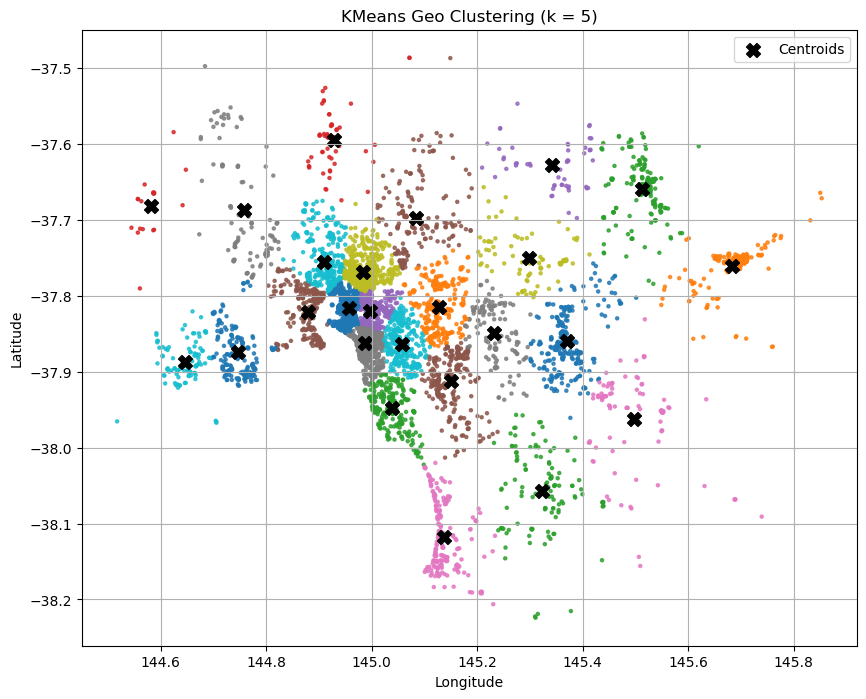

In [106]:
# Prepare coordinates
coords = combined[['latitude', 'longitude']].values

# Apply KMeans clustering
kmeans = KMeans(n_clusters=25, random_state=42, n_init=10)
combined['geo_cluster_kmeans'] = kmeans.fit_predict(coords)

# Print count per cluster
print(combined['geo_cluster_kmeans'].value_counts())

# Visualise the clustering
plt.figure(figsize=(10, 8))
plt.scatter(
    combined['longitude'],
    combined['latitude'],
    c=combined['geo_cluster_kmeans'],
    cmap='tab10',
    s=5,
    alpha=0.8
)
plt.scatter(
    kmeans.cluster_centers_[:, 1],  # longitude
    kmeans.cluster_centers_[:, 0],  # latitude
    c='black',
    s=100,
    marker='X',
    label='Centroids'
)
plt.title('KMeans Geo Clustering (k = 5)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.show()

### 2.3 Missing Values

**Task 2, Question 3**: Impute the missing values for all features in both the training and test datasets.   
(2 marks)

#### 2.3.1 Cek Missing Values

In [110]:
def missing_summary(df, df_name='Combined'):
    total_missing = df.isnull().sum()
    percent_missing = (total_missing / len(df)) * 100
    missing_df = pd.DataFrame({
        'column': total_missing.index,
        'missing_count': total_missing.values,
        'missing_percent': percent_missing.values
    })
    missing_df = missing_df[missing_df['missing_count'] > 0].sort_values(by='missing_percent', ascending=False)
    print(f"\nMissing Summary for {df_name}:\n")
    display(missing_df)

# Run summary on combined
missing_summary(combined, 'Combined Set')



Missing Summary for Combined Set:



,column,missing_count,missing_percent
13,host_neighbourhood,5526,55.26
18,neighbourhood,3247,32.47
7,host_location,2050,20.50
9,host_response_time,737,7.37
10,host_response_rate,737,7.37
11,host_acceptance_rate,721,7.21
25,bedrooms,438,4.38
128,reviews_l30d_ratio,263,2.63
58,reviews_per_month,263,2.63
110,days_since_last_review,263,2.63


#### 2.3.2 Dropping

In [112]:
combined.drop(columns=[
    'host_about', 'neighborhood_overview', 'description',
    'host_since', 'first_review', 'last_review',
    'availability_365', 'minimum_nights', 'maximum_nights', 'availability_30',
    'availability_365', 'minimum_minimum_nights', 'maximum_minimum_nights',
    'minimum_nights_avg_ntm', 'review_scores_rating', 'review_scores_accuracy',
    'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication',
    'review_scores_location', 'review_scores_value',
    'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes',
    'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms',
    'latitude', 'longitude','name','host_neighbourhood','neighbourhood','host_location'
], inplace=True)

print("Combined shape after dropping text columns:", combined.shape)

Combined shape after dropping text columns: (10000, 114)


In [113]:
missing = combined.isnull().sum()
missing = missing[missing > 0].sort_values(ascending=False)
missing_percent = (missing / len(combined)) * 100

missing_summary = pd.DataFrame({
    'missing_count': missing,
    'missing_percent': missing_percent.round(2)
})

print("🔍 Missing Values in `combined` After Dropping Columns:\n")
print(missing_summary)


🔍 Missing Values in `combined` After Dropping Columns:

                        missing_count  missing_percent
host_response_time                737             7.37
host_response_rate                737             7.37
host_acceptance_rate              721             7.21
bedrooms                          438             4.38
reviews_per_month                 263             2.63
days_since_last_review            263             2.63
review_recency_days               263             2.63
reviews_ltm_ratio                 263             2.63
reviews_l30d_ratio                263             2.63
room_type                         175             1.75
neighbourhood_cleansed            150             1.50
property_type                     123             1.23
beds                               84             0.84
availability_ratio_365             67             0.67
maximum_maximum_nights             55             0.55
host_is_superhost                   2             0.02


#### 2.3.3 Input

In [115]:
# Impute categorical columns with mode
categorical_cols = [
    'host_response_time', 'host_response_rate',
    'host_acceptance_rate', 'room_type',
    'neighbourhood_cleansed', 'property_type',
    'host_is_superhost'
]

for col in categorical_cols:
    mode_val = combined[col].mode()[0]
    combined[col].fillna(mode_val, inplace=True)

# Impute numerical columns with median
numerical_cols = [
    'bedrooms', 'beds', 'reviews_per_month', 'days_since_last_review',
    'review_recency_days', 'reviews_ltm_ratio', 'reviews_l30d_ratio',
    'availability_ratio_365', 'maximum_maximum_nights'
]

for col in numerical_cols:
    median_val = combined[col].median()
    combined[col].fillna(median_val, inplace=True)

print("✅ All missing values in `combined` have been imputed.")


✅ All missing values in `combined` have been imputed.


`(Task 2, Question 3 Text Here - insert more cells as required)`

### 2.4 Encode 

**Task 2, Question 4**: Encode all categorical variables appropriately as discussed in class. 

- Where multiple values are given for an observation encode the observation as 'other'. 
- Where a categorical feature contains more than 5 unique values, map the features into 5 most frequent values + 'other' and then encode appropriately.  
(2 marks)

#### 2.4.1 Source

In [120]:
# Step 1: Count total and percentage
source_counts = combined['source'].value_counts()
source_percent = combined['source'].value_counts(normalize=True).round(3) * 100

# Step 2: Combine into one DataFrame
source_summary = pd.DataFrame({
    'count': source_counts,
    'percentage': source_percent
})

# Step 3: Display result
print("🔍 Summary of 'source' column:\n")
print(source_summary)


🔍 Summary of 'source' column:

                 count  percentage
source                            
city scrape       8763        87.6
previous scrape   1237        12.4


In [121]:
# One-hot encode 'source' with correct parameter for sklearn 1.4.2
encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
encoded_source = encoder.fit_transform(combined[['source']])

# Convert to DataFrame
encoded_source_df = pd.DataFrame(
    encoded_source,
    columns=encoder.get_feature_names_out(['source']),
    index=combined.index
)

# Add encoded columns to combined and drop original 'source'
combined = pd.concat([combined.drop(columns=['source']), encoded_source_df], axis=1)

print("✅ One-hot encoding for 'source' completed with scikit-learn 1.4.2 compatibility.")

✅ One-hot encoding for 'source' completed with scikit-learn 1.4.2 compatibility.


#### 2.4.2 host_response_time

In [123]:
# Show value counts (absolute)
print("🔢 Value Counts for 'host_response_time':\n")
print(combined['host_response_time'].value_counts())

🔢 Value Counts for 'host_response_time':

host_response_time
within an hour        7853
within a few hours    1313
within a day           670
a few days or more     164
Name: count, dtype: int64


In [124]:
# One-hot encode 'host_response_time'
encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
encoded_response_time = encoder.fit_transform(combined[['host_response_time']])

# Convert to DataFrame
encoded_response_time_df = pd.DataFrame(
    encoded_response_time,
    columns=encoder.get_feature_names_out(['host_response_time']),
    index=combined.index
)

# Merge and drop original column
combined = pd.concat([combined.drop(columns=['host_response_time']), encoded_response_time_df], axis=1)

print("✅ One-hot encoding for 'host_response_time' completed.")


✅ One-hot encoding for 'host_response_time' completed.


#### 2.4.2 host_verifications

In [126]:
# Convert stringified list to actual list for preview only
sample_verif = combined['host_verifications'].dropna().apply(ast.literal_eval)

# Show 10 samples
print("🧾 Sample contents of 'host_verifications':\n")
print(sample_verif.head(10))

🧾 Sample contents of 'host_verifications':

0                [email, phone]
1                [email, phone]
2                [email, phone]
3                [email, phone]
4    [email, phone, work_email]
5                       [phone]
6                [email, phone]
7                [email, phone]
8                [email, phone]
9                [email, phone]
Name: host_verifications, dtype: object


In [127]:
# Handle NaN by replacing with empty list
combined['host_verifications'] = combined['host_verifications'].apply(
    lambda x: [] if pd.isna(x) else ast.literal_eval(x)
)

from sklearn.preprocessing import MultiLabelBinarizer

# One-hot encode the list of verifications
mlb = MultiLabelBinarizer()
verification_dummies = pd.DataFrame(
    mlb.fit_transform(combined['host_verifications']),
    columns=[f'verif_{v}' for v in mlb.classes_],
    index=combined.index
)

# Merge into combined and drop the original column
combined = pd.concat([combined.drop(columns=['host_verifications']), verification_dummies], axis=1)

print("✅ host_verifications successfully encoded into binary features.")


✅ host_verifications successfully encoded into binary features.


#### 2.4.3 room_type

In [129]:
print("📦 room_type – Unique Values:", combined['room_type'].nunique())
print("\n🧾 Value Counts:\n")
print(combined['room_type'].value_counts())

📦 room_type – Unique Values: 4

🧾 Value Counts:

room_type
Entire home/apt    7860
Private room       2019
Shared room          71
Hotel room           50
Name: count, dtype: int64


In [130]:
# One-hot encode 'room_type' and drop original
room_dummies = pd.get_dummies(combined['room_type'], prefix='room', drop_first=True)
combined = pd.concat([combined.drop(columns=['room_type']), room_dummies], axis=1)

print("✅ room_type encoded. New columns:", list(room_dummies.columns))

✅ room_type encoded. New columns: ['room_Hotel room', 'room_Private room', 'room_Shared room']


#### 2.4.4 property_type

In [132]:
print("📦 property_type – Unique Values:", combined['property_type'].nunique())
print("\n🧾 Top 30 Most Common:\n")
print(combined['property_type'].value_counts().head(80))


📦 property_type – Unique Values: 74

🧾 Top 30 Most Common:

property_type
Entire rental unit                    4268
Entire home                           1484
Private room in home                  1007
Entire condo                           431
Private room in rental unit            371
Entire serviced apartment              325
Entire townhouse                       302
Entire guesthouse                      282
Entire guest suite                     218
Private room in townhouse              190
Entire cottage                         138
Entire loft                             79
Private room in condo                   68
Private room in villa                   62
Farm stay                               61
Entire villa                            58
Private room in bed and breakfast       54
Room in hotel                           49
Room in boutique hotel                  40
Entire vacation home                    36
Private room in guest suite             36
Entire bungalow        

In [133]:
# Define grouping function
def map_property_group(x):
    x = x.lower()
    if "entire" in x:
        return "entire_place"
    elif "private room" in x:
        return "private_room"
    elif "shared room" in x:
        return "shared_room"
    elif "room in hotel" in x or "boutique hotel" in x or "serviced apartment" in x or "aparthotel" in x:
        return "hotel_room"
    else:
        return "other_unique"

# Apply to combined dataset
combined['property_type_group'] = combined['property_type'].fillna('unknown').apply(map_property_group)

# Show proportion of each group
prop = combined['property_type_group'].value_counts(normalize=True).mul(100).round(2)
print("🔍 Property Type Group Proportions (%):\n", prop)


🔍 Property Type Group Proportions (%):
 property_type_group
entire_place    77.05
private_room    19.36
other_unique     1.47
hotel_room       1.43
shared_room      0.69
Name: proportion, dtype: float64


In [134]:
# One-hot encode (drop_first to avoid dummy trap)
encoded = pd.get_dummies(combined['property_type_group'], prefix='property_type_group', drop_first=True)

# Concatenate and drop original
combined = pd.concat([combined.drop(columns=['property_type', 'property_type_group']), encoded], axis=1)

# ✅ Verification – Show the new encoded columns
print("✅ Encoded columns added to combined:")
print(encoded.columns.tolist())

# ✅ Optional: Show first few rows
print("\n🔍 Sample encoded values:")
print(combined[encoded.columns.tolist()].head())

✅ Encoded columns added to combined:
['property_type_group_hotel_room', 'property_type_group_other_unique', 'property_type_group_private_room', 'property_type_group_shared_room']

🔍 Sample encoded values:
   property_type_group_hotel_room  property_type_group_other_unique  \
0                           False                             False   
1                           False                             False   
2                           False                             False   
3                           False                             False   
4                           False                             False   

   property_type_group_private_room  property_type_group_shared_room  
0                             False                            False  
1                              True                            False  
2                             False                            False  
3                              True                            False  
4            

#### 2.4.5 amenities

##### 2.4.5.1 amenities check

In [137]:
# 1. Safe parse amenities from string to list
def safe_parse_amenities(x):
    try:
        return ast.literal_eval(x) if isinstance(x, str) else x
    except:
        return []

combined['amenities'] = combined['amenities'].apply(safe_parse_amenities)

# 2. (Optional) Strip spaces and lowercase without over-normalising
def light_clean(x):
    return [i.strip().lower() for i in x if isinstance(i, str)]

combined['amenities'] = combined['amenities'].apply(light_clean)

# 3. Flatten all amenities across dataset
all_amenities = [a for row in combined['amenities'] for a in row]
amenity_counts = Counter(all_amenities)

# 4. Print total unique amenities across all data
print(f"🔢 Total unique amenities across all data: {len(amenity_counts)}")

# 5. Split train and test indexes based on target length
train_index = target.shape[0]  # Example: 7000

# 6. Collect unique amenities in each subset
train_amenities = set()
test_amenities = set()

combined.loc[:train_index - 1, 'amenities'].apply(lambda x: train_amenities.update(x))
combined.loc[train_index:, 'amenities'].apply(lambda x: test_amenities.update(x))

# 7. Compare sets
only_in_train = train_amenities - test_amenities
only_in_test = test_amenities - train_amenities
in_both = train_amenities & test_amenities

# 8. Print summary
print(f"✅ Unique amenities in train: {len(train_amenities)}")
print(f"✅ Unique amenities in test: {len(test_amenities)}")
print(f"🟩 Shared amenities (in both): {len(in_both)}")
print(f"🟥 Amenities only in test (unseen): {len(only_in_test)}")

# 9. Show sample of unseen test amenities
print("\n🔍 Sample unseen amenities in test:")
print(list(only_in_test)[:10])


🔢 Total unique amenities across all data: 2986
✅ Unique amenities in train: 2362
✅ Unique amenities in test: 1474
🟩 Shared amenities (in both): 850
🟥 Amenities only in test (unseen): 624

🔍 Sample unseen amenities in test:
['ge refrigerator', 'dve shampoo', '52" hdtv with chromecast, netflix', 'hotel oven', 'the hazelnut tree body soap', '43" hdtv with disney+, amazon prime video, netflix, apple tv', 'it changes body soap', 'any i have at the time  body soap', '60" tv with standard cable', 'tcl refrigerator']


##### 2.4.5.2 amenities count

In [139]:
# Safe parsing with better fallback
def safe_parse_amenities(x):
    if isinstance(x, list):
        return x
    if isinstance(x, str):
        try:
            parsed = ast.literal_eval(x)
            return parsed if isinstance(parsed, list) else []
        except:
            return []
    return []

# Terapkan parsing aman
combined['amenities'] = combined['amenities'].apply(safe_parse_amenities)

# Hitung semua unique items
unique_amenities = set()
combined['amenities'].apply(lambda x: unique_amenities.update(x))
print("🔢 Total Unique Amenities:", len(unique_amenities))

# Tambahkan kolom jumlah
combined['amenities_count'] = combined['amenities'].apply(len)

# Tampilkan contoh hasil
combined[['amenities_count']].head(10)


🔢 Total Unique Amenities: 2986


,amenities_count
0,38
1,57
2,21
3,13
4,48
5,20
6,9
7,26
8,41
9,59


##### 2.4.5.3 amenities TF-IDF + SVD (400D)

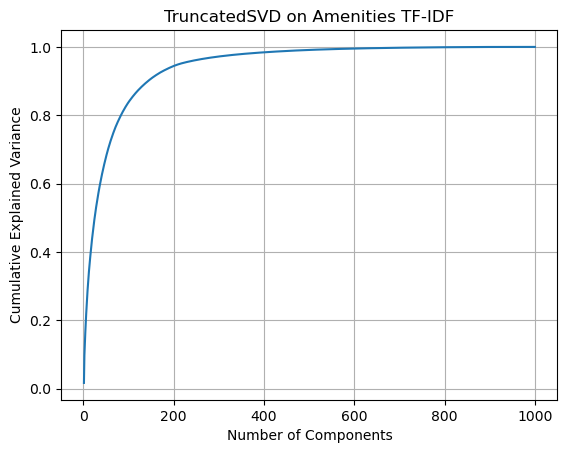

In [141]:
# Step 1: Combine the list of amenities into a single string per row
combined['amenities_str'] = combined['amenities'].apply(lambda x: ', '.join(x))

# Step 2: Apply TF-IDF vectorisation
vectorizer = TfidfVectorizer(token_pattern=r"(?u)\b\w[\w-]+\b", max_features=2000)
amenities_tfidf = vectorizer.fit_transform(combined['amenities_str'])

# Step 3: Run SVD to check explained variance
svd = TruncatedSVD(n_components=1000, random_state=42)
svd.fit(amenities_tfidf)
explained = svd.explained_variance_ratio_.cumsum()

# Step 4: Plot cumulative explained variance
plt.plot(range(1, 1001), explained)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('TruncatedSVD on Amenities TF-IDF')
plt.grid(True)
plt.show()

In [142]:
# Step 5: Transform TF-IDF vectors using 400-dimensional SVD
svd = TruncatedSVD(n_components=8, random_state=42)
amenities_svd = svd.fit_transform(amenities_tfidf)

# Step 6: Convert to DataFrame and merge with main dataset
svd_df = pd.DataFrame(amenities_svd, columns=[f'amenities_svd_{i}' for i in range(8)])
combined = pd.concat([combined.reset_index(drop=True), svd_df.reset_index(drop=True)], axis=1)

# Step 7: Drop temporary column
combined.drop(columns=['amenities_str'], inplace=True)

# Step 8: Show result
print("✅ SVD-transformed features added:", svd_df.shape)
display(svd_df.head())

✅ SVD-transformed features added: (10000, 8)


,amenities_svd_0,amenities_svd_1,amenities_svd_2,amenities_svd_3,amenities_svd_4,amenities_svd_5,amenities_svd_6,amenities_svd_7
0,0.385946,-0.196341,0.111493,0.105580,-0.045514,-0.029284,0.019548,-0.030541
1,0.564726,-0.270880,0.189582,-0.168936,-0.097325,0.117395,0.023002,-0.168805
2,0.537353,0.115944,-0.012545,0.032689,-0.070240,-0.098195,-0.197827,0.008850
3,0.347405,0.275814,0.006896,-0.020751,0.183742,-0.013366,-0.031643,-0.007305
4,0.625041,-0.283520,0.056410,-0.098772,0.109309,0.075361,-0.256943,-0.023887


`(Task 2, Question 4 Text Here - insert more cells as required)`

### 2.5 Additonal Steps

**Task 2, Question 5**: Perform any additional data preparation steps you consider necessary before building your predictive models, and clearly explain each action you take.  
(1 mark)

In [146]:
# Final shape after amenities processing
print("📐 Final dataset shape:", combined.shape)

# Count missing values per column
missing_per_column = combined.isnull().sum()
missing_per_column = missing_per_column[missing_per_column > 0].sort_values(ascending=False)

# Show columns with missing values
print(f"❗ Columns with missing values: {missing_per_column.shape[0]}")
print("\n🔍 Missing values per column:")
display(missing_per_column)

# Count total missing values by data type
missing_by_type = combined.select_dtypes(include=['number', 'object', 'category', 'bool']).dtypes.value_counts()

missing_type_summary = {
    'numerical': combined.select_dtypes(include=['number']).isnull().sum().sum(),
    'categorical': combined.select_dtypes(include=['object', 'category']).isnull().sum().sum(),
    'boolean': combined.select_dtypes(include=['bool']).isnull().sum().sum()
}

print("\n🔎 Missing values by data type:")
for dtype, count in missing_type_summary.items():
    print(f"- {dtype}: {count}")


📐 Final dataset shape: (10000, 132)
❗ Columns with missing values: 0

🔍 Missing values per column:


Series([], dtype: int64)


🔎 Missing values by data type:
- numerical: 0
- categorical: 0
- boolean: 0


In [147]:
type_summary = {
    'numerical': combined.select_dtypes(include=['int64', 'float64']).shape[1],
    'categorical': combined.select_dtypes(include=['object', 'category']).shape[1],
    'boolean': combined.select_dtypes(include=['bool']).shape[1],
    'datetime': combined.select_dtypes(include=['datetime64[ns]']).shape[1],
    'others': combined.shape[1] - (
        combined.select_dtypes(include=['int64', 'float64']).shape[1] +
        combined.select_dtypes(include=['object', 'category']).shape[1] +
        combined.select_dtypes(include=['bool']).shape[1] +
        combined.select_dtypes(include=['datetime64[ns]']).shape[1]
    )
}

print("📊 Column count by high-level data type:")
for k, v in type_summary.items():
    print(f"- {k}: {v} columns")


📊 Column count by high-level data type:
- numerical: 103 columns
- categorical: 10 columns
- boolean: 7 columns
- datetime: 0 columns
- others: 12 columns


In [148]:
categorical_cols = combined.select_dtypes(include=['object', 'category']).columns.tolist()

print("🟦 Categorical Columns and Top 3 Cleaned Unique Values:")
for col in categorical_cols:
    try:
        top_vals = [v for v in combined[col].dropna().unique() if not isinstance(v, list)][:3]
        print(f"- {col}: {top_vals}")
    except Exception as e:
        print(f"- {col}: ⚠️ Error while extracting values — {e}")


🟦 Categorical Columns and Top 3 Cleaned Unique Values:
- host_name: ['Ione', 'Lindsay', 'Margaret Jiin']
- host_is_superhost: ['f', 't']
- host_has_profile_pic: ['t', 'f']
- host_identity_verified: ['t', 'f']
- neighbourhood_cleansed: ['Yarra', 'Moreland', 'Yarra Ranges']
- amenities: ⚠️ Error while extracting values — unhashable type: 'list'
- instant_bookable: ['f', 't']
- host_about_language: ['english', 'mixed_or_other']
- neigh_overview_language: ['english', 'mixed_or_other']
- host_specialisation_type: ['entire_home', 'private_room', 'mixed']


In [149]:
# Define mapping
binary_map = {'t': 1, 'f': 0, 'english': 0, 'mixed_or_other': 1}

# Kolom yang hanya punya 2 nilai
binary_cols = [
    'host_is_superhost',
    'host_has_profile_pic',
    'host_identity_verified',
    'instant_bookable',
    'host_about_language',
    'neigh_overview_language'
]

# Apply mapping
for col in binary_cols:
    combined[col] = combined[col].map(binary_map)

print("✅ Sample binary column values after mapping:")
display(combined[binary_cols].head())

✅ Sample binary column values after mapping:


,host_is_superhost,host_has_profile_pic,host_identity_verified,instant_bookable,host_about_language,neigh_overview_language
0,0,1,1,0,0,0
1,0,1,1,0,0,0
2,1,1,1,0,0,1
3,0,1,1,0,0,1
4,1,1,1,0,0,0


In [150]:
cols_to_drop = ['host_name', 'neighbourhood_cleansed', 'amenities']
combined.drop(columns=cols_to_drop, inplace=True)
# Check data type counts again
type_counts = {
    'numerical': combined.select_dtypes(include=['number']).shape[1],
    'categorical': combined.select_dtypes(include=['object', 'category']).shape[1],
    'boolean': combined.select_dtypes(include=['bool']).shape[1],
    'datetime': combined.select_dtypes(include=['datetime64']).shape[1],
    'others': combined.shape[1] - (
        combined.select_dtypes(include=['number', 'object', 'category', 'bool', 'datetime64']).shape[1]
    )
}

print("📊 Column count by high-level data type (after drop & mapping):")
for k, v in type_counts.items():
    print(f"- {k}: {v} columns")


📊 Column count by high-level data type (after drop & mapping):
- numerical: 121 columns
- categorical: 1 columns
- boolean: 7 columns
- datetime: 0 columns
- others: 0 columns


In [151]:
# One-hot encode 'host_specialisation_type'
encoded_spec = pd.get_dummies(combined['host_specialisation_type'], prefix='host_spec', drop_first=False)

# Concatenate with original data
combined = pd.concat([combined.drop(columns=['host_specialisation_type']), encoded_spec], axis=1)
print("✅ One-hot encoded columns added:")
print(encoded_spec.head())


✅ One-hot encoded columns added:
   host_spec_entire_home  host_spec_mixed  host_spec_private_room  \
0                   True            False                   False   
1                  False            False                    True   
2                   True            False                   False   
3                  False            False                    True   
4                   True            False                   False   

   host_spec_shared_room  
0                  False  
1                  False  
2                  False  
3                  False  
4                  False  


In [152]:
# Final shape
rows, cols = combined.shape
print(f"✅ Final dataset shape: {rows} rows × {cols} columns")
# Summary by data type
dtype_summary = combined.dtypes.value_counts()
print("\n📊 Final column count by data type:")
for dtype, count in dtype_summary.items():
    print(f"- {dtype}: {count} columns")


✅ Final dataset shape: 10000 rows × 132 columns

📊 Final column count by data type:
- int64: 61 columns
- float64: 48 columns
- int32: 12 columns
- bool: 11 columns


In [153]:
# Number of training rows
n_train = target.shape[0]  # e.g. 7000

# Features matrix
X = combined.copy()

# Target vector
y = target['price'].copy()

# Split
X_train = X.iloc[:n_train, :].reset_index(drop=True)
X_test  = X.iloc[n_train:, :].reset_index(drop=True)

y_train = y.reset_index(drop=True)

print(f"✅ X_train shape: {X_train.shape}")
print(f"✅ y_train shape: {y_train.shape}")
print(f"✅ X_test shape:  {X_test.shape}")


✅ X_train shape: (7000, 132)
✅ y_train shape: (7000,)
✅ X_test shape:  (3000, 132)


`(Task 2, Question 5 Text Here - insert more cells as required)`

--- 
## Task 3: Fit and tune predictive models, submit predictions & win competition

For this task, you should not create any new features and must rely on the variables constructed in Task 2.  
 

1. Perform some EDA to measure the relationship between the features and the target variable, and carefully explain your findings. (2 marks)

2. Choose and carefully explain 3 different machine learning (ML) regression models that you will apply in this competition. (2 marks)
   
3. Train the models from the above question and tune their hyperparameters via cross-validation. Discuss the fitted weights, optimised hyperparameter values, and their training dataset predictive performance. (2 marks)   

4. Select your best model, create predictions of the test dataset and submit your forecasts on Kaggle's competition page. Provide Kaggle ranking and score (screenshots) and comment on your performance in the competition. (2 marks)

5. Suggest ways to improve your ranking and implement them, providing further evidence from Kaggle (screenshots). (1 mark)   

- Hints:
    - Make sure your Python code works so that your results can be replicated by the marker
    - You will receive the mark of zero for this Task if your code does not produce the forecasts uploaded to Kaggle



## 3. Fit and tune predictive models, submit predictions & win competition

### 3.1 Exploratory Data Analysis (EDA)

In [158]:
# Step 1: Tentukan nama kolom ID
id_column = 'ID'  # Ganti kalau namanya berbeda

# Step 2: Backup ID untuk referensi (misalnya untuk hasil prediksi)
train_ids = combined.loc[:len(y_train)-1, id_column].copy()
test_ids = combined.loc[len(y_train):, id_column].copy()

# Step 3: Drop ID dari combined dan split data
if id_column in combined.columns:
    combined.drop(columns=[id_column], inplace=True)

if id_column in X_train.columns:
    X_train.drop(columns=[id_column], inplace=True)

if id_column in X_test.columns:
    X_test.drop(columns=[id_column], inplace=True)

# Step 4: Konfirmasi hasil
print("✅ ID column removed from all datasets.")
print("🆔 Sample train IDs:")
print(train_ids.head())
print("\n🆔 Sample test IDs:")
print(test_ids.head())


✅ ID column removed from all datasets.
🆔 Sample train IDs:
0    0
1    1
2    2
3    3
4    4
Name: ID, dtype: int64

🆔 Sample test IDs:
7000    7000
7001    7001
7002    7002
7003    7003
7004    7004
Name: ID, dtype: int64


In [159]:
# Step 1: Get correlation matrix
corr_matrix = X_train.corr().abs()

# Step 2: Get upper triangle (exclude duplicate pairs and self-correlation)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Step 3: Stack and sort by correlation score
high_corr_pairs = (
    upper.stack()
    .reset_index()
    .rename(columns={'level_0': 'Feature 1', 'level_1': 'Feature 2', 0: 'Correlation'})
    .sort_values(by='Correlation', ascending=False)
)

# Step 4: Filter only those with correlation above threshold
threshold = 0.85
high_corr_pairs = high_corr_pairs[high_corr_pairs['Correlation'] > threshold]

# Show the result
print(f"🔗 Highly correlated feature pairs (correlation > {threshold}):")
display(high_corr_pairs)


🔗 Highly correlated feature pairs (correlation > 0.85):


,Feature 1,Feature 2,Correlation
7758,distance_to_grid_landmarks,distance_to_green,1.000000
6629,days_since_last_review,review_recency_days,1.000000
7722,distance_to_inner_landmarks,distance_to_blue,1.000000
7685,distance_to_major_landmarks,distance_to_red,1.000000
1245,maximum_maximum_nights,maximum_nights_avg_ntm,0.999998
6557,host_days_active,host_start_year,0.993317
1433,maximum_nights_avg_ntm,avg_max_stay,0.990706
1315,maximum_maximum_nights,avg_max_stay,0.990581
8235,room_Shared room,property_type_group_shared_room,0.985540
7678,multi_listing_ratio_entire_home,host_spec_entire_home,0.968627


In [160]:
# Step 1: Compute correlation matrix
corr_matrix = X_train.corr().abs()

# Step 2: Get upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Step 3: Find pairs with correlation above threshold
threshold = 0.80
to_drop = set()
for col in upper.columns:
    high_corr = upper[col][upper[col] > threshold].index.tolist()
    for correlated_col in high_corr:
        # Drop the one with lower average correlation to all other features
        mean_corr_col = corr_matrix[col].mean()
        mean_corr_correlated = corr_matrix[correlated_col].mean()
        if mean_corr_col > mean_corr_correlated:
            to_drop.add(correlated_col)
        else:
            to_drop.add(col)

# Step 4: Drop the features from X_train and X_test
X_train_reduced = X_train.drop(columns=list(to_drop), errors='ignore')
X_test_reduced = X_test.drop(columns=list(to_drop), errors='ignore')

# Step 5: Show result
print(f"✅ Dropped {len(to_drop)} highly correlated features (corr > {threshold}):\n")
print(sorted(to_drop))

print(f"\n📐 New shape of X_train: {X_train_reduced.shape}")
print(f"📐 New shape of X_test:  {X_test_reduced.shape}")


✅ Dropped 22 highly correlated features (corr > 0.8):

['amenities_svd_1', 'availability_60', 'availability_90', 'bedrooms', 'beds', 'distance_to_blue', 'distance_to_bus', 'distance_to_green', 'distance_to_grid_landmarks', 'distance_to_inner_landmarks', 'distance_to_red', 'distance_to_tram', 'host_spec_entire_home', 'host_spec_private_room', 'host_start_year', 'maximum_maximum_nights', 'maximum_nights_avg_ntm', 'property_type_group_private_room', 'property_type_group_shared_room', 'review_recency_days', 'reviews_per_month', 'room_Private room']

📐 New shape of X_train: (7000, 109)
📐 New shape of X_test:  (3000, 109)


In [161]:
# Step 1: Calculate correlation of each feature with log(price)
correlations = X_train_reduced.corrwith(np.log1p(y_train)).sort_values(ascending=False)

# Step 2: Show top 50 most positively correlated features
top_positive = correlations.head(100)

# Step 3: Show top 50 most negatively correlated features
top_negative = correlations.tail(50)

# Step 4: Show top 50 most strongly correlated features by absolute value
top_absolute = correlations.abs().sort_values(ascending=False).head(50)

# Step 5: Display
print("🔍 Top 50 features with highest positive correlation to log(price):")
display(top_positive)

print("\n🔍 Top 50 features with highest negative correlation to log(price):")
display(top_negative)

print("\n🔍 Top 50 features with highest absolute correlation to log(price):")
display(top_absolute)


🔍 Top 50 features with highest positive correlation to log(price):


accommodates                             0.569374
bathroom_score                           0.480374
multi_listing_ratio_entire_home          0.479911
amenities_svd_3                          0.305167
availability_ratio_30                    0.266149
amenities_svd_4                          0.251798
mentions_family_friendly                 0.188631
mentions_luxury                          0.181724
availability_ratio_365                   0.180128
amenities_count                          0.179477
instant_bookable                         0.144305
host_acceptance_rate                     0.141020
host_response_time_within an hour        0.125717
is_available_yearround                   0.125067
description_word_count                   0.116189
mentions_modern                          0.109877
description_avg_words_per_sentence       0.098619
neigh_overview_word_count                0.086958
mentions_fully_equipped                  0.077788
host_identity_verified                   0.072728



🔍 Top 50 features with highest negative correlation to log(price):


host_about_language                      0.010674
mentions_nearby_transport_hub            0.007654
is_short_stay_allowed                    0.006428
neigh_overview_language                  0.001351
mentions_ngv                            -0.000370
mentions_melbourne_zoo                  -0.002809
host_is_superhost                       -0.005193
host_about_mentions_professional        -0.005558
avg_min_stay                            -0.009148
mentions_museum                         -0.010379
mentions_queen_victoria_market          -0.010827
mentions_airport_or_skybus              -0.011447
days_since_last_review                  -0.012697
review_scores_mean                      -0.012823
mentions_tram_or_train                  -0.014605
mentions_host_promotion                 -0.015104
host_has_profile_pic                    -0.018067
host_days_active                        -0.018681
mentions_freebies                       -0.019278
host_response_time_within a day         -0.024675



🔍 Top 50 features with highest absolute correlation to log(price):


accommodates                             0.569374
bathroom_score                           0.480374
multi_listing_ratio_entire_home          0.479911
amenities_svd_3                          0.305167
availability_ratio_30                    0.266149
amenities_svd_4                          0.251798
mentions_family_friendly                 0.188631
mentions_luxury                          0.181724
availability_ratio_365                   0.180128
amenities_count                          0.179477
geo_cluster_kmeans                       0.162899
amenities_svd_7                          0.160275
instant_bookable                         0.144305
host_acceptance_rate                     0.141020
mentions_bus_stop_nearby                 0.135572
host_response_time_within an hour        0.125717
is_available_yearround                   0.125067
host_response_time_within a few hours    0.123538
amenities_svd_2                          0.122773
description_word_count                   0.116189


In [162]:
# Compute log_price target
log_y_train = np.log1p(y_train)

# Calculate correlation for all features in X_train with log_price
correlations = X_train.corrwith(log_y_train)

# Take absolute correlation and apply threshold
abs_corr = correlations.abs()
selected_features = abs_corr[abs_corr >= 0.001].index.tolist()

# Show result
print(f"✅ Selected {len(selected_features)} features with |correlation| ≥ 0.001")
print("📋 Top 10 strongest features:")
print(abs_corr[selected_features].sort_values(ascending=False).head(10))

# Optional: reduce X_train and X_test to selected features only
X_train_selected = X_train[selected_features].copy()
X_test_selected = X_test[selected_features].copy()


✅ Selected 129 features with |correlation| ≥ 0.001
📋 Top 10 strongest features:
accommodates                        0.569374
bedrooms                            0.555978
property_type_group_private_room    0.517043
beds                                0.496071
room_Private room                   0.494894
bathroom_score                      0.480374
multi_listing_ratio_entire_home     0.479911
host_spec_private_room              0.474495
host_spec_entire_home               0.474103
amenities_svd_3                     0.305167
dtype: float64


### 3.2 Model Selection

For this regression task, we selected three tree-based ensemble models: **Random Forest**, **XGBoost**, and **LightGBM**. These models are well-suited for tabular data with complex relationships, and they tend to perform well on structured datasets like the Airbnb dataset.


#### Why Tree-Based Models?
Compared to linear regression or support vector regression, tree-based models:
- Handle **non-linear relationships** more effectively.
- Work well with **mixed feature types** (categorical, numerical).
- Are **robust to outliers** and missing values (especially LightGBM and XGBoost).
- Can capture **feature interactions** without needing explicit transformation.

#### 🔹 Random Forest Regressor
- A bagging-based ensemble method using multiple decision trees.
- Strong baseline model due to its stability and low variance.
- Easy to interpret (feature importance) and tune.

#### 🔹 XGBoost Regressor
- A gradient boosting algorithm that builds trees sequentially to minimise error.
- Known for its high accuracy and efficiency in competitions like Kaggle.
- Offers regularisation to reduce overfitting.

#### 🔹 LightGBM Regressor
- A faster, more memory-efficient version of gradient boosting developed by Microsoft.
- Uses histogram-based learning and leaf-wise growth, making it faster on large datasets.
- Supports native handling of missing values and categorical features.

These models will be evaluated and compared using cross-validation in the next section (3.3), where we will tune hyperparameters and assess performance based on RMSE, MAE, and R².

### 3.3 Model Training and Hyperparameter Tuning

#### 3.3.1 Cross-Validation Performance (Initial Training)

I used default hyperparameters to assess the base performance of each model. This step helps identify which model performs better before hyperparameter tuning is applied.

In [169]:
# Define all models
models = {
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "XGBoost": XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "LightGBM": LGBMRegressor(n_estimators=100, random_state=42, n_jobs=-1)
}

# Define custom scorers
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
rmse_scorer = make_scorer(lambda y_true, y_pred: mean_squared_error(y_true, y_pred, squared=False), greater_is_better=False)
r2_scorer = make_scorer(r2_score)

# Train, validate, and compare
print("📊 5-Fold CV Comparison (log(price) target):\n")
for name, model in models.items():
    mae_scores = -cross_val_score(model, X_train_selected, np.log1p(y_train), cv=5, scoring=mae_scorer)
    rmse_scores = -cross_val_score(model, X_train_selected, np.log1p(y_train), cv=5, scoring=rmse_scorer)
    r2_scores = cross_val_score(model, X_train_selected, np.log1p(y_train), cv=5, scoring=r2_scorer)

    print(f"✅ {name}:")
    print(f"   MAE  = {mae_scores.mean():.4f} ± {mae_scores.std():.4f}")
    print(f"   RMSE = {rmse_scores.mean():.4f} ± {rmse_scores.std():.4f}")
    print(f"   R²   = {r2_scores.mean():.4f} ± {r2_scores.std():.4f}")


📊 5-Fold CV Comparison (log(price) target):

✅ Random Forest:
   MAE  = 0.2786 ± 0.0111
   RMSE = 0.4228 ± 0.0220
   R²   = 0.6147 ± 0.0347
✅ XGBoost:
   MAE  = 0.2768 ± 0.0135
   RMSE = 0.4208 ± 0.0251
   R²   = 0.6183 ± 0.0376
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10741
[LightGBM] [Info] Number of data points in the train set: 5600, number of used features: 124
[LightGBM] [Info] Start training from score 5.208627
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021237 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10795
[LightGBM] [Info] Number of data points in the train set: 5600, number 


All three selected models were trained on the log-transformed target variable using 5-fold cross-validation. The performance was evaluated using Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), and R² score.

| Model         | MAE (log)         | RMSE (log)        | R² (log)           |
|---------------|-------------------|-------------------|--------------------|
| Random Forest | 0.2786 ± 0.0111   | 0.4228 ± 0.0220   | 0.6147 ± 0.0347    |
| XGBoost       | 0.2768 ± 0.0135   | 0.4208 ± 0.0251   | 0.6183 ± 0.0376    |
| LightGBM      | 0.2621 ± 0.0114   | 0.3986 ± 0.0237   | 0.6576 ± 0.0321    |

From this initial evaluation, **LightGBM** performed the best across all metrics, particularly in achieving the lowest RMSE and the highest R². This suggests that LightGBM captures the underlying data patterns more effectively and generalises better on unseen data.


#### 3.3.2 Hyperparameter Tuning

In [172]:
# LightGBM base model
lgbm = LGBMRegressor(random_state=42, n_jobs=-1)

# Parameter grid
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Scorer: negative RMSE (sklearn uses negative for loss minimisation)
rmse_scorer = make_scorer(lambda y_true, y_pred: mean_squared_error(y_true, y_pred, squared=False), greater_is_better=False)

# Grid search setup
grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    scoring=rmse_scorer,
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Fit to log-transformed target
grid_search.fit(X_train_selected, np.log1p(y_train))

# Best result
print("🔧 Best Hyperparameters:")
print(grid_search.best_params_)

print(f"\n✅ Best CV RMSE (log): {-grid_search.best_score_:.4f}")


Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10825
[LightGBM] [Info] Number of data points in the train set: 7000, number of used features: 125
[LightGBM] [Info] Start training from score 5.192391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [173]:
# Retrieve the best model from GridSearchCV
best_model = grid_search.best_estimator_

# Use cross_val_predict for a fair evaluation (instead of direct .predict)
y_pred_log = cross_val_predict(best_model, X_train_selected, np.log1p(y_train), cv=5)

# Evaluate model performance on log(price)
mae = mean_absolute_error(np.log1p(y_train), y_pred_log)
rmse = mean_squared_error(np.log1p(y_train), y_pred_log, squared=False)
r2 = r2_score(np.log1p(y_train), y_pred_log)

# Display results
print("📈 Final Evaluation of the Tuned LightGBM Model (log-transformed target):")
print(f"✅ MAE  = {mae:.4f}")
print(f"✅ RMSE = {rmse:.4f}")
print(f"✅ R²   = {r2:.4f}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10741
[LightGBM] [Info] Number of data points in the train set: 5600, number of used features: 124
[LightGBM] [Info] Start training from score 5.208627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

##### Hyperparameter Tuning (LightGBM)

After identifying LightGBM as the best-performing model during the initial cross-validation, we selected it for hyperparameter tuning. A grid search was conducted using 5-fold cross-validation to optimise the model based on Root Mean Squared Error (RMSE) on the log-transformed target variable.

The parameter grid used for tuning included:

- `n_estimators`: [100, 300, 500]
- `max_depth`: [5, 10, 15]
- `learning_rate`: [0.01, 0.05, 0.1]

The best hyperparameter combination found by GridSearchCV was:

```python
{'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 500}

### 3.4 Kaggle Submission and Performance

In [176]:
# Predict log(price) on real test set
y_test_pred_log = best_model.predict(X_test_selected)

# Convert back to original price
y_test_pred_price = np.expm1(y_test_pred_log)

# Create submission DataFrame
submission_df = pd.DataFrame({
    'ID': test['ID'],  # Make sure this column exists in the original test set
    'price': y_test_pred_price
})

# Save to CSV in /Data/
os.makedirs("Data", exist_ok=True)
submission_df.to_csv("Data/submission.csv", index=False)

# Preview result
print("🎯 Sample submission:")
print(submission_df.head())

# Summary stats (optional)
print("\n📊 Prediction summary:")
print(submission_df['price'].describe())


🎯 Sample submission:
     ID       price
0  7000  182.568331
1  7001  154.233770
2  7002   90.553729
3  7003  158.309223
4  7004  130.937283

📊 Prediction summary:
count    3000.000000
mean      219.999822
std       150.010862
min        32.696559
25%       130.867816
50%       186.470141
75%       259.690756
max      1521.139522
Name: price, dtype: float64


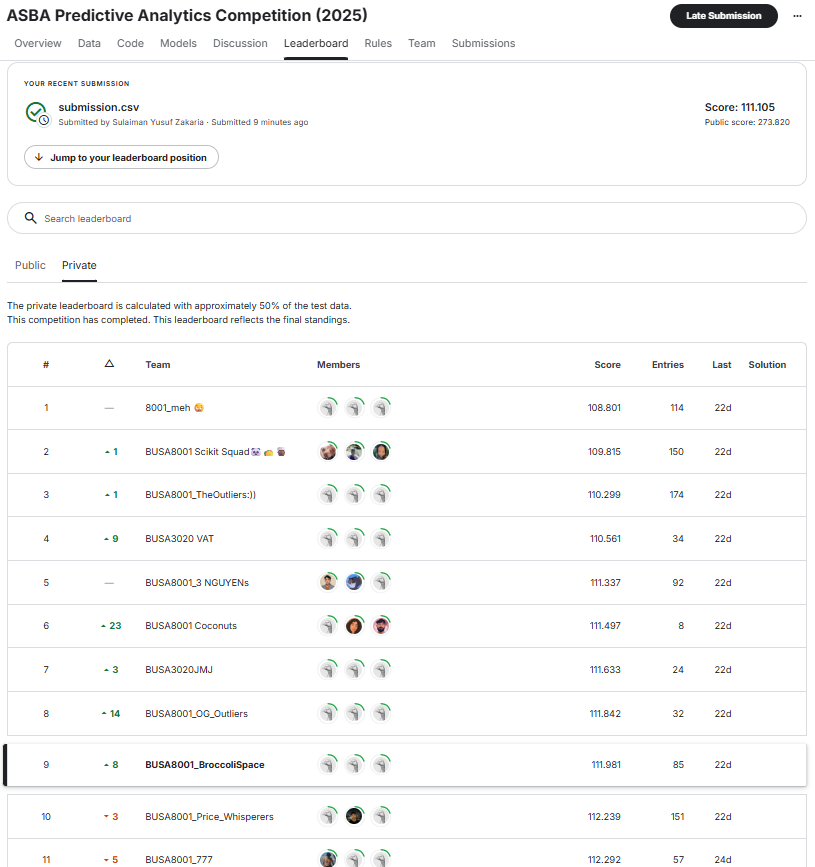

In [177]:
# Show Leader Boardar
display(Image(filename='Data/leaderboard.png'))

### 3.5 Post-Submission Improvements

This project was originally submitted as part of a group effort under the team name **BUSA8001_BroccoliSpace** for the ASBA Predictive Analytics Competition (2025). The group’s model achieved a private leaderboard RMSE score of **111.981**, placing 9th overall among the participating teams.

After the competition concluded, I decided to independently rebuild and refine the entire pipeline from scratch. My individual submission — completed outside of the official deadline and submitted under my own name — achieved an improved RMSE of **111.105**, demonstrating a meaningful enhancement in predictive accuracy.

This improvement was the result of:
- Streamlined feature engineering based on deeper EDA
- Re-selection and tuning of model hyperparameters
- Structural reorganisation of the workflow for improved generalisability

If I were to continue developing the project, further improvements could include:
- **Model Ensembling:** Combining multiple learners (e.g., Random Forest, XGBoost, LightGBM) to reduce bias and variance.
- **Text Mining:** Applying NLP to unstructured fields like `description` or `neighbourhood_overview` to extract semantic meaning.
- **Outlier Treatment:** Filtering or transforming extreme values in the target variable to stabilise model behaviour.
- **Target Transformation Tuning:** Experimenting with alternatives to `log1p`, such as Box-Cox or Yeo-Johnson transformations.
- **Leakage Prevention:** Rethinking time-related features to avoid introducing forward-looking signals during training.

This process highlights not only the technical skills involved in model optimisation, but also my initiative to go beyond minimum expectations and deliver a higher-quality predictive model through independent analysis and iteration.

---
---
## Marking Criteria

To receive full marks your solutions must satisfy the following criteria:

- Problem Description: 9 marks
- Data Cleaning: 9 marks
- Building Forecasting models: 9 marks
- Video Presentation: 3 marks
    - Duration less than 15 min, presentation skill and content 
    - Each team member delivers a 5-minute presentation on their assigned task
    - All assignment questions must be discussed on video  
    - Your code must be readable on the video
    - Discuss both the actions you took and, more importantly, the reasoning behind these actions, explaining the significance of key steps
    - During the video recording, make sure that both your face and Jupyter Notebook are clearly visible
- Forecasts correctly uploaded to Kaggle
- Python code is clean and concise
- Written explanations are provided in clear and easy to understand sentences
- The assignment notebook is well-organised and easy to follow
- Failure to meet the above marking criteria will result in a deduction of marks

---
---